## EEG preprocessing with MNE

<br/>

Preprocessing describes the process of preparing neurophysiological data, such as the EEG data we'll be dealing with in this chapter, for further analysis. This mainly involves removing artifacts (interference or noise due to physiological or environmental) from the recorded data, cutting out breaks in experiments, removing faulty (bad) channels and dividing the continous data into chunks centered around certain events (e.g. the presentation of a stimulus, participant's reactions etc.). For the analysis of EEG data a few extra-steps are necessary to produce a dataset that can provide precise information about changes in neural activity or localization of involved areas, such as setting up a reference channel and applying a montage.

**For examples of possible preprocessing steps see:**

<a href="https://www.frontiersin.org/articles/10.3389/fninf.2015.00016/full#h3">The PREP pipeline: standardized preprocessing for large-scale EEG analysis </a>


<a href="https://www.youtube.com/watch?v=JMB9nZNGVyk">Youtube: Overview of possible preprocessing steps (Mike Cohen)
 </a>
 
- and corresponding a whole <a href="https://mikexcohen.com/lectures.html">set of lectures for EEG data analysis (Mike Cohen)
 </a>
 

**There is also an automated MNE pipeline that is continously improved**

<a href="https://mne.tools/mne-bids-pipeline/getting_started/basic_usage.html">
MNE-BIDS-Pipeline  </a>



<br/>

### Setup

As in the previous chapter we'll first import our necessary libraries and the <a href="https://mne.tools/stable/overview/datasets_index.html" title="https://mne.tools/stable/overview/datasets_index.html">sample dataset</a> provided by MNE. 

In [1]:
# import necessary libraries/functions
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scipy

# this allows for interactive pop-up plots
#%matplotlib qt

# allows for rendering in output-cell
%matplotlib inline

# import mne library
import mne
from mne_bids import BIDSPath, write_raw_bids, print_dir_tree, make_report, read_raw_bids

In [2]:
# load some sample data, overwrite previous data
sample_data_folder = mne.datasets.sample.data_path()
sample_data_raw_file = os.path.join(sample_data_folder, 'MEG', 'sample',
                                    'sample_audvis_raw.fif')
raw = mne.io.read_raw_fif(sample_data_raw_file, preload=True)

Opening raw data file /home/michael/mne_data/MNE-sample-data/MEG/sample/sample_audvis_raw.fif...
    Read a total of 3 projection items:
        PCA-v1 (1 x 102)  idle
        PCA-v2 (1 x 102)  idle
        PCA-v3 (1 x 102)  idle
    Range : 25800 ... 192599 =     42.956 ...   320.670 secs
Ready.
Reading 0 ... 166799  =      0.000 ...   277.714 secs...


In [3]:
raw.info  # check the info object

<Info | 21 non-empty values
 acq_pars: ACQch001 110113 ACQch002 110112 ACQch003 110111 ACQch004 110122 ...
 bads: 2 items (MEG 2443, EEG 053)
 ch_names: MEG 0113, MEG 0112, MEG 0111, MEG 0122, MEG 0123, MEG 0121, MEG ...
 chs: 204 Gradiometers, 102 Magnetometers, 9 Stimulus, 60 EEG, 1 EOG
 custom_ref_applied: False
 description: acquisition (megacq) VectorView system at NMR-MGH
 dev_head_t: MEG device -> head transform
 dig: 146 items (3 Cardinal, 4 HPI, 61 EEG, 78 Extra)
 events: 1 item (list)
 experimenter: MEG
 file_id: 4 items (dict)
 highpass: 0.1 Hz
 hpi_meas: 1 item (list)
 hpi_results: 1 item (list)
 lowpass: 172.2 Hz
 meas_date: 2002-12-03 19:01:10 UTC
 meas_id: 4 items (dict)
 nchan: 376
 proj_id: 1 item (ndarray)
 proj_name: test
 projs: PCA-v1: off, PCA-v2: off, PCA-v3: off
 sfreq: 600.6 Hz
>

<br/>

## 1.Referencing

As the EEG is a measurement of voltage fluctuations (differences in electric potential), we will have to naturally compare the signal measured at a specific electrode to that measured at another location. 

Therefore we'll first define a reference channel, i.e. an electrode with which the signal of electrodes of interest can be compared. This is effecitively done by substracting the signal of the reference from our measurement electrodes. When recording EEG a specific electrode or a set of electrodes should be employed that are placed in such a way that they collect ideally all the "noise" that is also influencing our measurement electrodes at the scalp, but as little as possible of the actual neural activity of interest. Common choices for the placement of reference electrodes are the earlobes or the mastoids (the bone ridges behind the ears), although sometimes central electrodes such as Cz or FCz are chosen. If we'd be interested in the signal measuered at these sites, we would have to re-reference our data.

There is a few ways to go about referencing, chek-out the <a href="https://mne.tools/stable/auto_tutorials/preprocessing/55_setting_eeg_reference.html" title="https://mne.tools/stable/auto_tutorials/preprocessing/55_setting_eeg_reference.html">MNE tutorial: Setting the EEG reference</a> for more info.

First we'll exclude the meg channels from our data, as we won't be needing those for our EEG introduction. We'll use the <a href="https://mne.tools/stable/generated/mne.pick_types.html" title="https://mne.tools/stable/generated/mne.pick_types.html">pick_types()</a> fucntion, specifying which channels to keep and which to exclude by type.

In [4]:
raw = raw.pick_types(meg=False, eeg=True, eog=True, stim=True)

Removing projector <Projection | PCA-v1, active : False, n_channels : 102>
Removing projector <Projection | PCA-v2, active : False, n_channels : 102>
Removing projector <Projection | PCA-v3, active : False, n_channels : 102>


<br/>

We can use use the <a href="https://mne.tools/stable/generated/mne.viz.plot_sensors.html" title="https://mne.tools/stable/generated/mne.viz.plot_sensors.html">.plot_sensors()</a> function to see how electrodes where placed on the scalp.

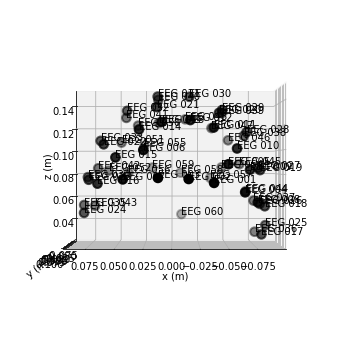

In [5]:
raw.plot_sensors(show_names=True, kind='3d', ch_type='eeg');

Using matplotlib as 2D backend.
Opening raw-browser...


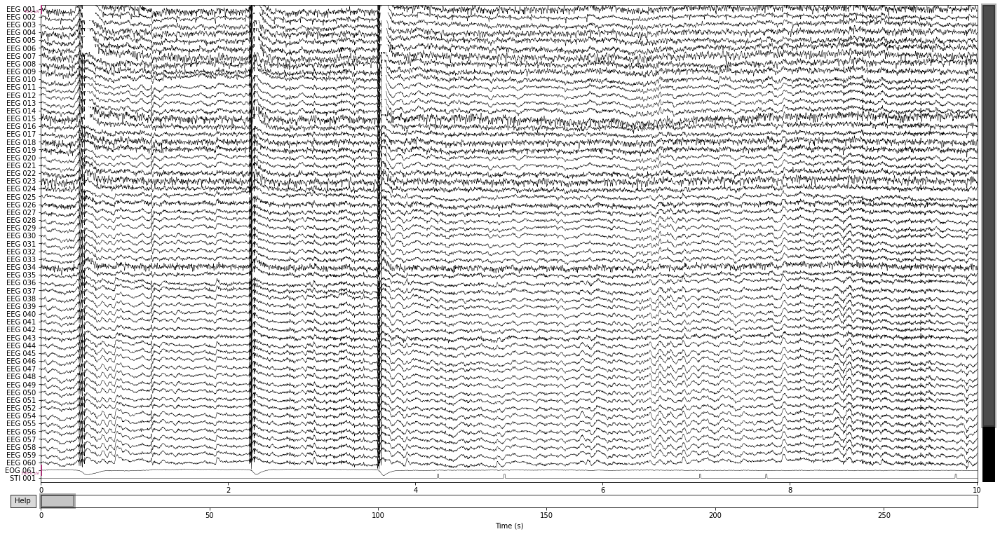

In [6]:
raw.plot(n_channels=61);

<br/>

Unfortunately the sample data wasn't collected using one of the <a href="https://www.fieldtriptoolbox.org/getting_started/1020/" title="https://www.fieldtriptoolbox.org/getting_started/1020/">standard layouts</a> we usually see, so it is unclear if any mastoid electrodes we're placed. Corresponding most closely to the usual positions would be the electroed "EEG 025" and "EEG 024", therefore we'll see how these would function as a reference channel using the <a href="https://mne.tools/stable/generated/mne.set_bipolar_reference.html" title="https://mne.tools/stable/generated/mne.set_bipolar_reference.html">mne.set_bipolar_reference()</a> function.


In [7]:
raw_bi_ref = mne.set_bipolar_reference(raw, 
                                       anode=['EEG 025'],
                                       cathode=['EEG 024'])

EEG channel type selected for re-referencing
Creating RawArray with float64 data, n_channels=1, n_times=166800
    Range : 25800 ... 192599 =     42.956 ...   320.670 secs
Ready.
Added the following bipolar channels:
EEG 025-EEG 024


<br/>

and comparing the referenced data to our raw data, we'll see that the reference channel EEG 025-EEG 024 was added in 

Opening raw-browser...


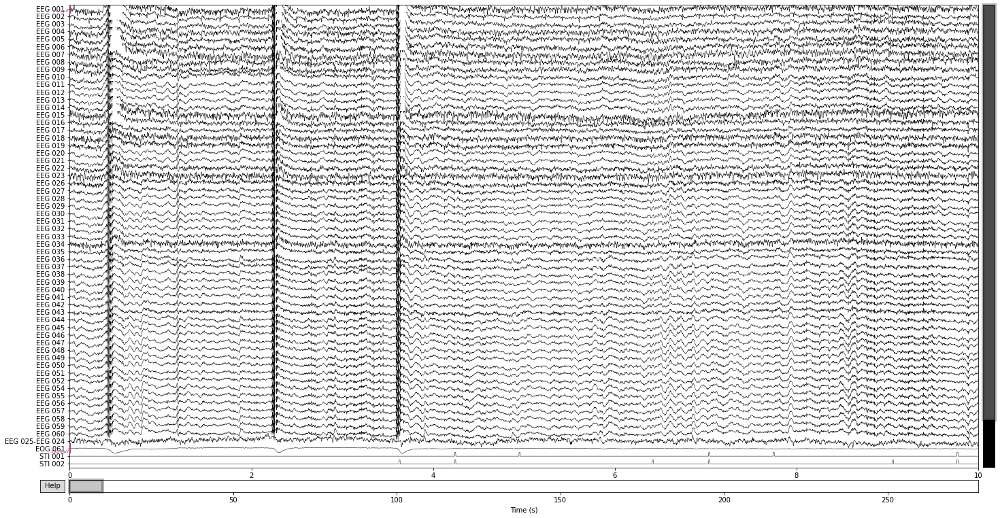

In [8]:
raw_bi_ref.plot(n_channels=61);

<br/>

With the <a href="https://mne.tools/stable/generated/mne.io.Raw.html#mne.io.Raw.set_eeg_reference" title="https://mne.tools/stable/generated/mne.io.Raw.html#mne.io.Raw.set_eeg_reference">.set_eeg_reference()</a>  function we can also apply a virtual reference channel by averaging over all electrodes by setting the parameter to ref_channels='average'. This will overwrite our original raw data, therefore we'll make a <a href="https://mne.tools/stable/generated/mne.io.Raw.html#mne.io.Raw.copy" title="https://mne.tools/stable/generated/mne.io.Raw.html#mne.io.Raw.copy">copy()</a> of our raw object before assigning the data to a new variable.

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Opening raw-browser...


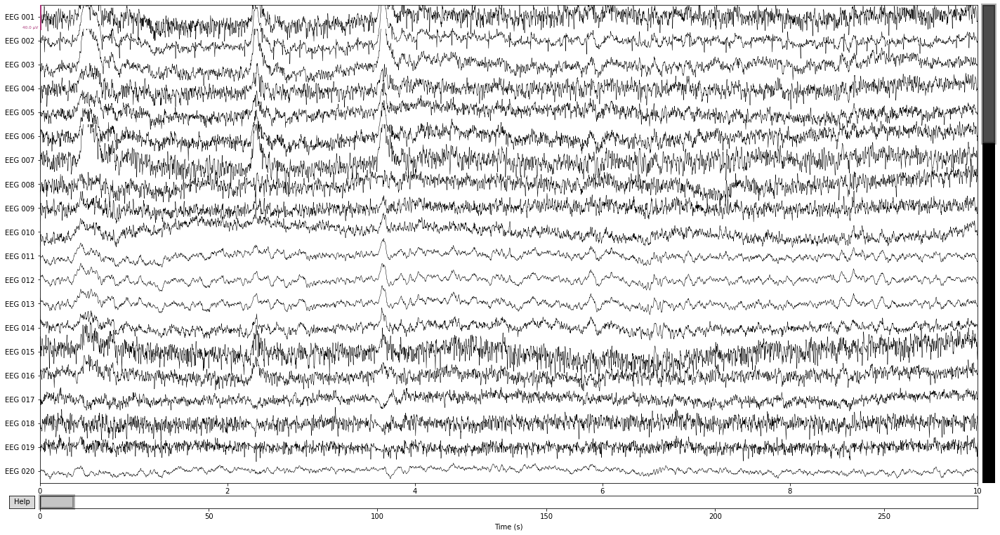

In [9]:
# use the average of all channels as reference
raw_avg_ref = raw.copy().set_eeg_reference(ref_channels='average')
raw_avg_ref.plot();

<br/>

We'll be using the averaged referenced data for the next preprocessing steps, so we can get rid of the bipolar reference.

In [10]:
del raw_bi_ref  # delete the bipolar referenced data as we won't be using it

<br/>

## 2. Artifact detection

**The 3 main sources of artifacts are environmental (due to power lines or electroncis), instrumentation (faulty electrodes), and biological (eye-movement, muscular activity).**

For an extensive list see the <a href="https://mne.tools/stable/auto_tutorials/preprocessing/10_preprocessing_overview.html#sphx-glr-auto-tutorials-preprocessing-10-preprocessing-overview-py" title="https://mne.tools/stable/auto_tutorials/preprocessing/10_preprocessing_overview.html#sphx-glr-auto-tutorials-preprocessing-10-preprocessing-overview-py">MNE tutorial on artifact detection</a> 

The easiest way to spot these artifacts is to simply plot the raw data if you know what you're looking for.
For example, artifacts due to eye movement will appear as a sudden step in amplitude that persist for a while in the raw data. While artifacts due to blinking will appear as a sudden spike in amplitude that is strongest in frontal electrodes and subsides with distance to the eyes. Artifacts due to muscle activity appear as sudden bursts of high frequency activity with high amplitude in the raw data.

Let's see what we can find

Opening raw-browser...


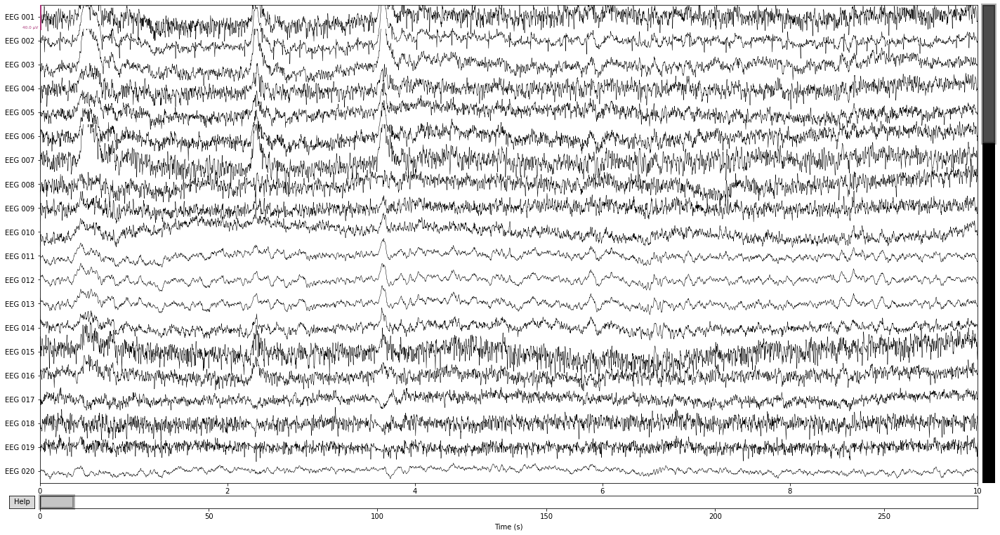

In [11]:
raw_avg_ref.plot();

<br/>

Another possibility is to plot the power spectral density (PSD, i.e. the power as µV²/Hz in dB in the frequency domain) of of our signal for each channel using the <a href="https://mne.tools/stable/generated/mne.viz.plot_raw_psd.html" title="MNE API: raw.plot_psd()"> raw.plot_psd() </a> function.

The clear spikes in power in the 60 Hz, 120 Hz etc. frequeny range are indicative of environmental interference caused by AC power lines.

Effective window size : 3.410 (s)


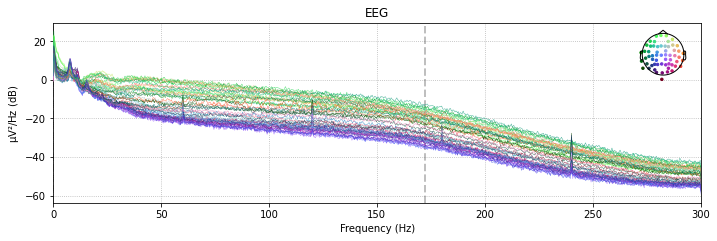

In [12]:
raw_avg_ref.plot_psd(spatial_colors=True, picks=['eeg']);

<br/>

To identify artifacts automatically, we can use specific MNE functions.

E.g. for finding eye-movemnt artifacts due to blinks MNE provides <a href="https://mne.tools/stable/generated/mne.preprocessing.create_eog_epochs.html" title="MNE API: create_eog_epochs"> create_eog_epochs() </a> and <a href="https://mne.tools/stable/generated/mne.preprocessing.find_eog_events.html" title="MNE API: find_eog_events"> find_eog_events() </a>, which we'll use to illustrate the mean wave-form of blinks in our data:

Using EOG channel: EOG 061
EOG channel index for this subject is: [68]
Filtering the data to remove DC offset to help distinguish blinks from saccades
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 6007 samples (10.001 sec)

Now detecting blinks and generating corresponding events
Found 46 significant peaks
Number of EOG events detected: 46
Not setting metadata
46 matching events found
No baseline correction applied
Using data from preloaded Raw for 46 events and 601 original time points ...
0 bad epochs dropped
No projector specified for this dataset. Please consider the method s

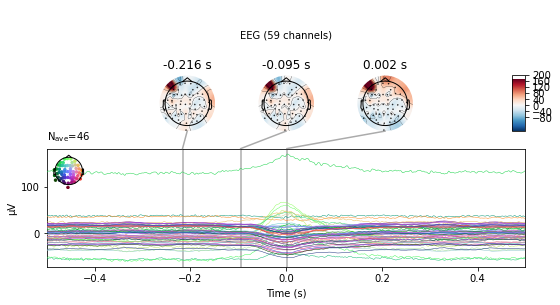

In [13]:
eog_epochs = mne.preprocessing.create_eog_epochs(raw_avg_ref)  # create eog epochs
eog_epochs.average().plot_joint();   #  plot eog activity in source space and topography

<br/>

**Bad channels are most easliy identified by  visual inspection:**
Does the signal captured by an electrode look significantly different in relation to surrounding channels? E.g. a completly flat line, high variability (i.e. appear "noisy") or slow amplitude "drifts" over prolonged timespans. Calling the .plot() function allows us to mark channels that appear problematic by simply clicking on them, which will add them to a list object containing info on all channels marked as bad.

Opening raw-browser...


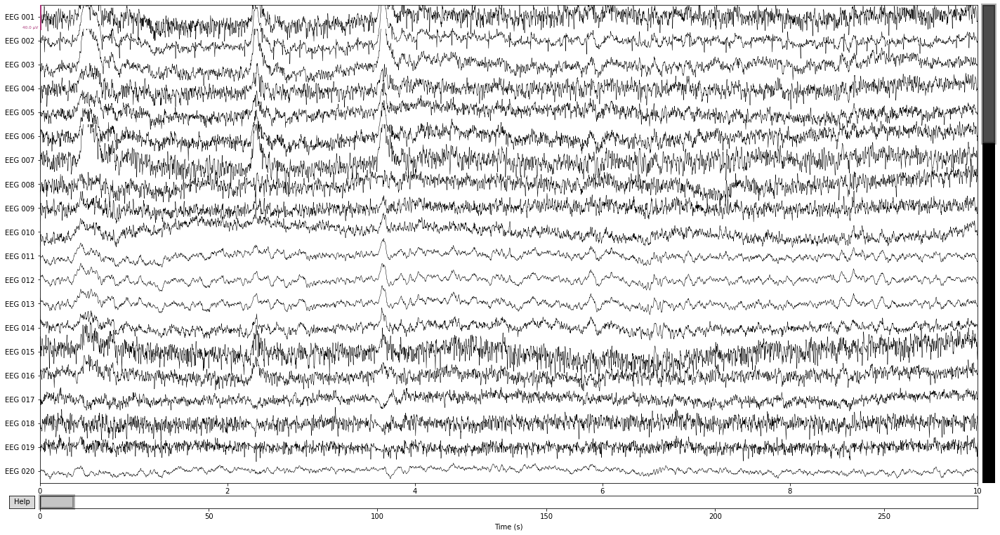

In [14]:
raw_avg_ref.plot();

<br/>

For a more automatic approach we can identify bad channels if the contained signal exceeds a certain deviation threshold by calculating the median absolute deviation of the signal in each channel compared to the others (check <a href="https://cloudxlab.com/assessment/displayslide/6286/robust-z-score-method" title="https://cloudxlab.com/assessment/displayslide/6286/robust-z-score-method">robust-z-score-method</a> for more info).

In [15]:
channel = raw_avg_ref.copy().pick_types(eeg=True).info['ch_names']  # get list of eeg channel names
data_ = raw_avg_ref.copy().pick_types(eeg=True).get_data() * 1e6  # * 1e6 to transform to microvolt

# calculate median absolute deviation for each channel
mad_scores =[scipy.stats.median_abs_deviation(data_[i, :], scale=1) for i in range(data_.shape[0])]

# compute z-scores for each channel
z_scores = 0.6745 * (mad_scores - np.nanmedian(mad_scores)) / scipy.stats.median_abs_deviation(mad_scores, 
                                                                                                scale=1)
# 1/1.4826=0.6745 (scale factor for MAD for non-normal distribution) 

print(z_scores)
# get channel containing outliers 
bad_dev = [channel[i] for i in np.where(np.abs(z_scores) >= 3.0)[0]]
print(bad_dev)

[ 2.93167008  1.86691661  2.09310209  4.53669083  1.7094114   1.91507927
  3.42109942  3.10263133  1.15765809  3.55407866  0.03090902  0.
  0.07612489  0.62614561  3.10922774  1.1404617   0.14003354  1.39446589
  0.32007086 -0.89047971 -0.67367991 -0.04997815  1.60603094  0.71714524
  2.01475609  0.04695926 -1.01900083 -1.02329586 -0.5332095   0.12645023
 -0.88577349 -1.09949559 -1.09459968  0.67719062 -0.10036744  1.20170778
  0.39599687 -0.44442974 -0.83317981 -1.04410547 -0.71924608 -1.02629246
 -0.36268423 -0.01897108 -0.5094786   0.95862707 -0.6745      0.57131944
 -0.35042718 -0.36892057 -0.34527809 -0.52673014 -0.15169144 -0.46104639
 -0.31247056 -0.20796368 -0.42393661 -0.05808648  0.47628818]
['EEG 004', 'EEG 007', 'EEG 008', 'EEG 010', 'EEG 015']


<br/>

## 3. Artifact removal/repair

Next we'll try to eliminate and or repair the previously identified artifacts with using different methods (frequency-filtering, rejecting bad channels and Independent component analysis). It is important to note that not all artifacts are problematic or should necessarily lead to complete data rejection, so we'll try to retain as much signal as possible by removing the contaminated signal component and estimating the true signal we'd record if the specific artifacts where not present.

For a primer on how to decide which artifacts should be removed/not removed see <a href="https://www.youtube.com/watch?v=VDqwfP0mlfU" title="https://www.youtube.com/watch?v=VDqwfP0mlfU">Youtube: Signal artifacts (not) to worry about</a>.

<br/>

### 3.1 Filtering


Line noise and slow drifts are most easily dealt with by **applying a filter to our data that artifically removes any activity above (highpass) or below (lowpass) a certain frequency**. As the range of frequency that is actually relevant for our data or plausibly produced by neural activity is rather limited, we can for example get rid of the above identified line noise artifacts quite easily by setting a cut-off frequency (lowpass-filter) for our data somewhere below 60Hz.

There is extensive literature on and a plethora off methods to consider when it comes to eeg-filters, but for this tutorial we'll be using the mne standard parameters. For more info on eeg-filters see the <a href="https://mne.tools/stable/auto_tutorials/preprocessing/25_background_filtering.html" title="MNE: background on filtering">MNE: background on filtering</a> or for a visual approach <a href="https://www.youtube.com/watch?v=2tmilbi4L0o" title="Youtube: FIR Filter Design using the Window Method">Youtube: FIR Filter Design using the Window Method</a>.


**We'll be setting a highpass filter at 0.1hz (to get rid of slow drifts in electrode conductance over time) and a low-pass filter of 40hz (to get rid of electrical line noise).**


In [16]:
raw_filtered = raw_avg_ref.copy().filter(l_freq=.1, h_freq=40.,  # lfreq = lower cut-off frequency; hfreq =upper cut-off frequency
                 picks=['eeg', 'eog'],  # which channel to filter by type
                 filter_length='auto',
                 l_trans_bandwidth='auto',
                 h_trans_bandwidth='auto',
                 method='fir',  # finite response filter; MNE default
                 phase='zero',
                 fir_window='hamming',  # i.e. our "smoothing function" (MNE-default)
                 fir_design='firwin',
                 n_jobs=1)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 19821 samples (33.001 sec)



<br/>

Comparing the filtered data in the time domain shows that we got rid of a lot of the "noisiness" present in the individual channels, as well as attentuated some of the high-frequency muscle artifacts. Ocular artifacts are still clearly present.

Opening raw-browser...


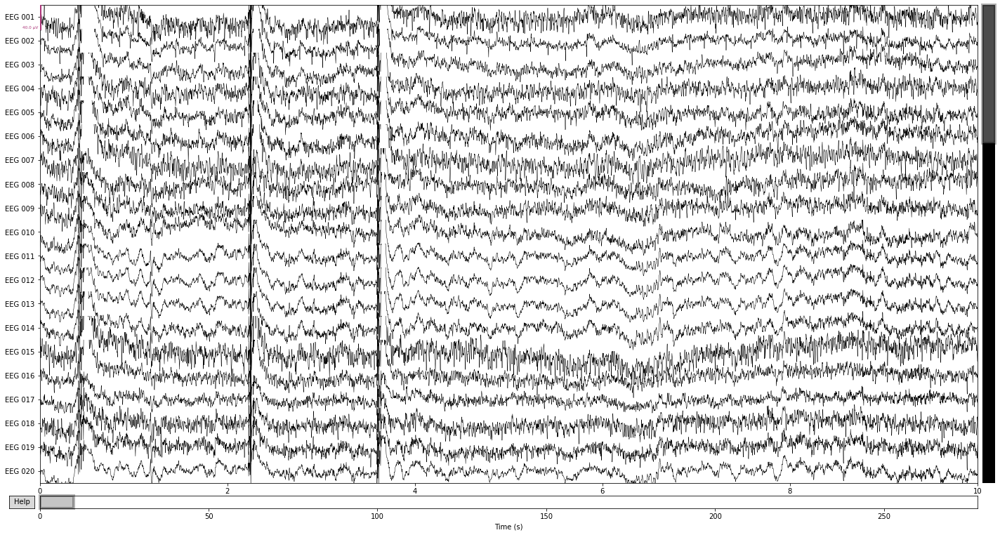

In [17]:
raw.plot();

Opening raw-browser...


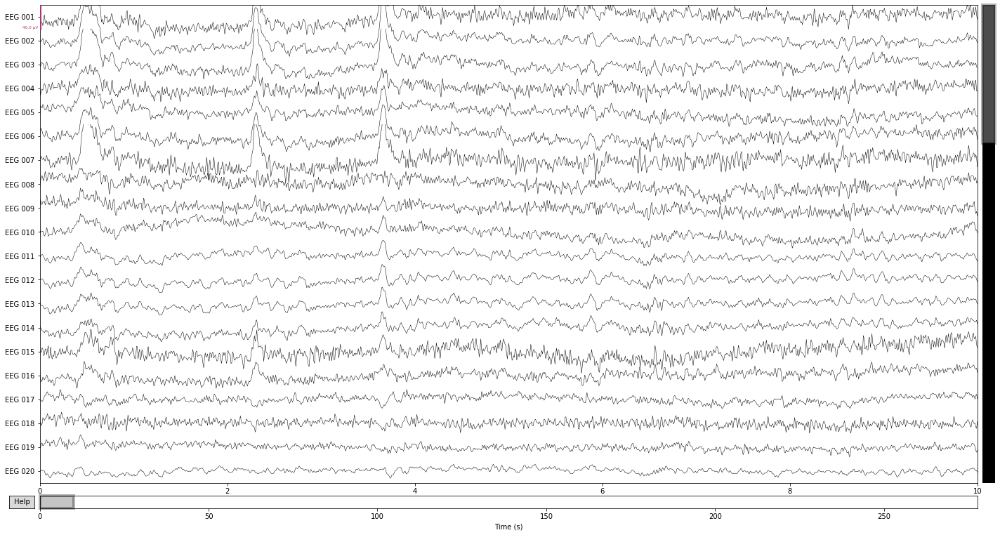

In [18]:
raw_filtered.plot();

<br/>

Comparing the power spectral density plots of our filtered and unfiltered data revals that frequencies above the specifed cut-off are basically eliminated from our data. The power-spectral density plot further illustrates that there is a certain drop-off range called the **transition band**, which in this case is about 10Hz after the specified cut-off frequency pf 40Hz

Effective window size : 3.410 (s)


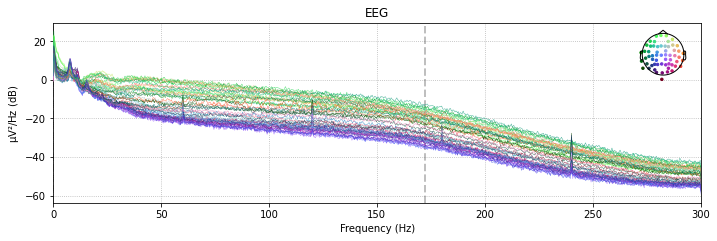

In [19]:
# unfiltered power spectral density (PSD)
raw_avg_ref.plot_psd(spatial_colors=True);

Effective window size : 3.410 (s)


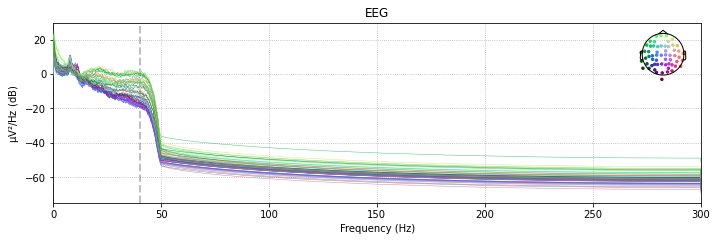

In [20]:
# filtered power spectral density (PSD)
raw_filtered.plot_psd(spatial_colors=True);

<br/>

### 3.2 Interpolating bad channels

Let's first take a look at the previoulsly marked bad channels for our unfiltered data again.

In [21]:
bad_dev

['EEG 004', 'EEG 007', 'EEG 008', 'EEG 010', 'EEG 015']

<br/>

Next we calculate the median absolute deviations again, but this time for the filtered data.

In [22]:
channel = raw_filtered.copy().pick_types(eeg=True).info['ch_names']  # get list of eeg channel names
data_ = raw_filtered.copy().pick_types(eeg=True).get_data() * 1e6  # * 1e6 to transform to microvolt

# calculate median absolute deviation for each channel
mad_scores =[scipy.stats.median_abs_deviation(data_[i, :], scale=1) for i in range(data_.shape[0])]

# compute z-scores for each channel
z_scores = 0.6745 * (mad_scores - np.nanmedian(mad_scores)) / scipy.stats.median_abs_deviation(mad_scores, 
                                                                                                scale=1)
# 1/1.4826=0.6745 (scale factor for MAD for non-normal distribution) 

print(z_scores)
# get channel containing outliers 
bad_dev = [channel[i] for i in np.where(np.abs(z_scores) >= 3.0)[0]]
print(bad_dev)

[ 2.53491522  1.73967805  2.30066055  3.08832218  1.66155918  1.85743653
  3.14194962  2.46251724  0.90603823  2.26484445  0.06479951  0.29247788
  0.3325463   0.70652085  2.51787841  0.89403503  0.          0.6745
 -0.35824365 -0.8605855  -0.59368432 -0.37479054  0.91453675  0.47206722
  2.17453196 -0.48878472 -1.20579555 -1.04112896 -0.72032546  0.16183855
 -0.85172137 -1.05013466 -1.09402637  0.03657005 -0.04724789  1.38467332
 -0.13037815 -0.68966154 -0.91377994 -0.95780618 -0.82304069 -1.00630492
 -0.32368758  0.08028723 -0.43569248  0.97852603 -0.60128033  0.40168626
 -0.35229997 -0.32971686 -0.26989682 -0.55193517  0.05454042 -0.25843797
 -0.10949953 -0.04371482 -0.23934103  0.13879019  0.16710858]
['EEG 004', 'EEG 007']


<br/>
Now we see that only 2 out of 5 channels are considered to be outliers. So it appears that our filter got rid of some of the problematic noise in our channels already. We'll check if there is already info about bad channels in the metadata of our raw object, that the experimenters may have already provide. Information on which channels are bad is stored in the .info object. 

In [23]:
raw_filtered.info['bads']

[]

<br/>

Adding our outlier channels to the list of "bad" channesl basically means that we declare that these channels should not be considered for further analysis. 

As .info['bads'] is a regular python list we can edit it in a few simple ways, e.g. let's say electrode EEG 007 would look wildly out of place compared to the signal in the surrounding electrodes. Now e.g. we can add entries using .append() to our list

In [24]:
raw_filtered.info['bads'].append('EEG 007')               # add bad channel
raw_filtered.info['bads']

['EEG 007']

<br/>
remove entries via .pop

In [25]:
raw_filtered.info['bads'].pop(-1)  # remove last entry
raw_filtered.info['bads']

[]

<br/>
and add multiple values to our list of bads or even completly replace our list of bad channels.

In [26]:
old_bads = raw_filtered.info['bads'] # create variable containing original bad channels
new_bads = ['EEG 008', 'EEG 009']  # create list of channels to add

# overwrite the whole list
raw_filtered.info['bads'] = new_bads
print(raw_filtered.info['bads'])

# or combine old an new list of bad channels
raw_filtered.info['bads'] = old_bads + new_bads
print(raw_filtered.info['bads'])

['EEG 008', 'EEG 009']
['EEG 008', 'EEG 009']


<br/>
Let's empty our list of bad channels for now

In [27]:
raw_filtered.info['bads'] = [] # set empty list
print(raw_filtered.info['bads'])

[]


and add the outlier channels we've identified above

In [28]:
raw_filtered.info['bads'] = bad_dev 
print(raw_filtered.info['bads'])

['EEG 004', 'EEG 007']


<br/>
taking a look at the "Bad channels" row of the .info reveals that the marked channels are now part of the raw objects metadata.

In [29]:
raw_filtered.info

<Info | 21 non-empty values
 acq_pars: ACQch001 110113 ACQch002 110112 ACQch003 110111 ACQch004 110122 ...
 bads: 2 items (EEG 004, EEG 007)
 ch_names: STI 001, STI 002, STI 003, STI 004, STI 005, STI 006, STI 014, ...
 chs: 9 Stimulus, 59 EEG, 1 EOG
 custom_ref_applied: True
 description: acquisition (megacq) VectorView system at NMR-MGH
 dev_head_t: MEG device -> head transform
 dig: 146 items (3 Cardinal, 4 HPI, 61 EEG, 78 Extra)
 events: 1 item (list)
 experimenter: MEG
 file_id: 4 items (dict)
 highpass: 0.1 Hz
 hpi_meas: 1 item (list)
 hpi_results: 1 item (list)
 lowpass: 40.0 Hz
 meas_date: 2002-12-03 19:01:10 UTC
 meas_id: 4 items (dict)
 nchan: 69
 proj_id: 1 item (ndarray)
 proj_name: test
 projs: []
 sfreq: 600.6 Hz
>

<br/>

### Interpolation


Now that we know which channels are problematic, we can **estimate their actual signal given the signal of the surrounding electrodes** via the <a href="https://mne.tools/stable/generated/mne.io.Raw.html#mne.io.Raw.interpolate_bads" title="https://mne.tools/stable/generated/mne.io.Raw.html#mne.io.Raw.interpolate_bads">.interpolate_bads()</a> fucntion, as with the relatively poor spatial resolution it is highly unklikey that one electrode would have picked up a signal that is not also to a to lesser degree present in the surrounding electrodes. This concept is illustrated well in the visualizatio of the topopgraphic spread of evoked potentials <a href="https://mne.tools/stable/auto_examples/visualization/topo_compare_conditions.html" title="https://mne.tools/stable/auto_examples/visualization/topo_compare_conditions.html">here</a>. See the <a href="https://mne.tools/stable/auto_examples/preprocessing/interpolate_bad_channels.html#footcite-perrinetal1989" title="MNE tutorial: interpolate bad channels"> MNE tutorial: interpolate bad channels </a> for more on the implementation and the therein cited papers for the technical information.

When to interpolate or drop bad channels should be decided on an individual basis. In general, **if the signal picked up is consistently bad/noisy and might influence the overall quality of the data the channel can be interpolated**. If there are only single "ariftact events in" the channel it's best to keep the channel and later on exclude the epoch containing the artifact. For automatization purposes you'll of course have to make an a priori decison on what levels of noise e.g. you're willing to accept.

In [30]:
print(raw_filtered.info['bads'])

['EEG 004', 'EEG 007']


<br/>

For ilustrative purposes we'll interpolate the channels we've identified as outliners above and compare the data before and after interpolation.

Interpolating bad channels
    Automatic origin fit: head of radius 91.0 mm
Computing interpolation matrix from 57 sensor positions
Interpolating 2 sensors
Opening raw-browser...


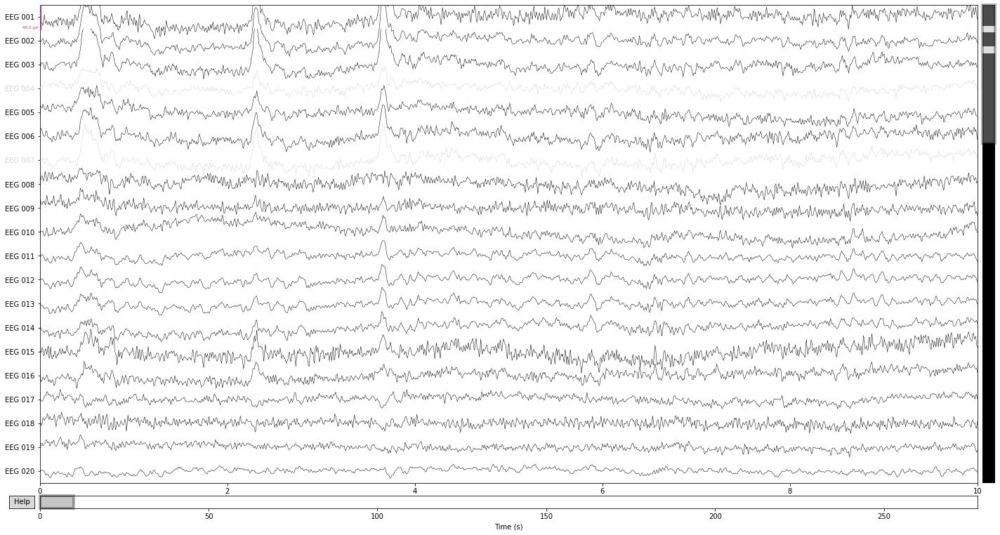

In [31]:
interp_ = raw_filtered.copy().interpolate_bads(reset_bads=False)  # copy() as this would modify the raw object in place
interp_.plot();

Opening raw-browser...


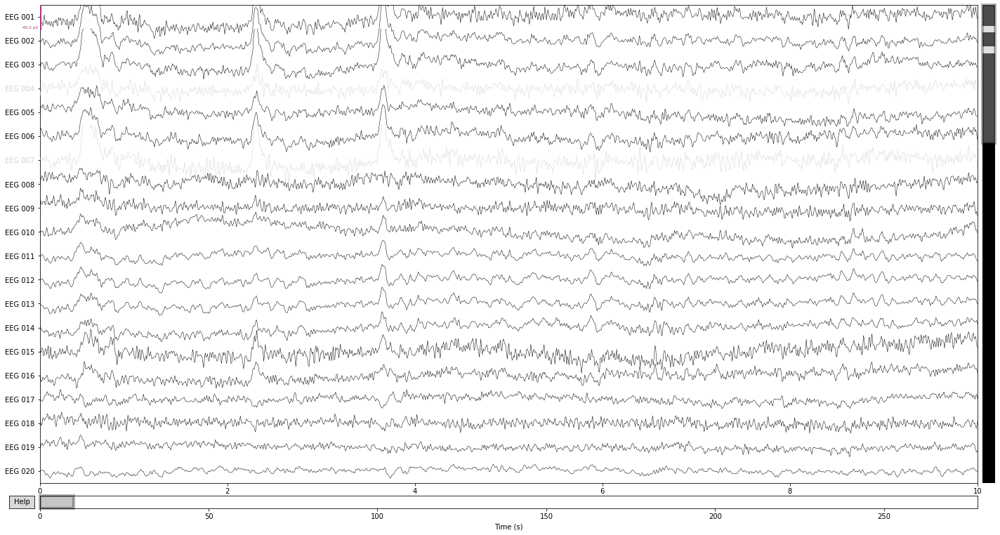

In [32]:
raw_filtered.plot();

<br/>
We see a reduction in the amplitude of the high frequency components in the channels "EEG 004" and "EEG 007", as well as an general "reshaping" of the data as a composition of activity in the surrounding channels. A prominent example would be the change in wave-form for the first blink-artifact in channel "EEG 004".

Let's apply this to our data and reset our bad channels, so that they'll not be excluded from further analysis anymore.

In [33]:
raw_filtered.interpolate_bads(reset_bads=True)

Interpolating bad channels
    Automatic origin fit: head of radius 91.0 mm
Computing interpolation matrix from 57 sensor positions
Interpolating 2 sensors


<Raw | sample_audvis_raw.fif, 69 x 166800 (277.7 s), ~90.8 MB, data loaded>

In [34]:
del interp_ # delete to free up space

<br/>

### 3.3 Independent component analysis (ICA)


**One of the most common and effetive tools for artifact detection and removal is the Independent component analysis, which we'll use to exclude our occular artifacts from the data in the next step**

In brief:
ICA is a technique for signal processing that separates a signal into a specified number of linearly mixed sources. For the preprocessing of EEG data this is  used to find statistically independet sources of signal variability present in our n_channel dimensional data. EEG artifacts are usually strong sources of variability as they show higher amplitude than would be expected for sources of neural activity and generally appear more consistent than fluctuating neural activity, best illustrated by occular artifacts, and can therefore be easily identified via ICA.

**An ICA is performed in multiply steps:**

1. Specify the ICA algorithm/paramertes:
    - n_components = the number of components we want to decompose our signal in. The more components one includes the more accurate the ICA solution becomes, i.e. the finer grained your sources of variability will be identified in the specific components.
    - max_iter = the number of iterations for approximation (see <a href="https://en.wikipedia.org/wiki/Iterative_method" title="https://en.wikipedia.org/wiki/Iterative_method">Wikipedia: iterative processes</a> for more)
    - random_state = identifier for the initial value/decomposition matrix used (as ICA is non-deterministic this is necessary to reproduce the same output when repeating the ICA)
    - method = the ICA algorithm to use, defaults to "fastica". Choice of algorithm usually boils down to computational speed vs. maximization of information (see the <a href="https://mne.tools/stable/generated/mne.preprocessing.ICA.html#mne.preprocessing.ICA" title="https://mne.tools/stable/generated/mne.preprocessing.ICA.html#mne.preprocessing.ICA">MNE API: preprocessing.ICA</a> for more  information)
    

2. Fit the ICA to the data/Identify ICA components
    - visualize your component solution, i.e artifact detection
    - for an introductionary tutorials to identifying ICA components in eeg see <a href="https://labeling.ucsd.edu/tutorial/labels" title="ICLabel Tutorial: EEG Independent Component Labeling">ICLabel Tutorial: EEG Independent Component Labeling </a>

3. Specify which components should be removed from the data

4. Reconstructing the Signal, i.e. apply the ICA solution with the components containing artifacts excluded from the data
<br/>

**Further reading**

For more theory on the ICA and how it's used in MNE etc. see the <a href="https://mne.tools/stable/auto_tutorials/preprocessing/40_artifact_correction_ica.html" title="MNE tutorial: artifact correction via ica"> MNE tutorial: artifact correction via ica </a> and  <a href="https://scikit-learn.org/stable/auto_examples/decomposition/plot_ica_blind_source_separation.html#sphx-glr-auto-examples-decomposition-plot-ica-blind-source-separation-py" title="Scikit-learn example: ica blind source separation">Scikit-learn example: ica blind source separation </a>

For more general explanations on ICA for EEG data, what to look for, which artifacts to include etc., see the video <a href="https://www.youtube.com/watch?v=kWAjhXr7pT4&list=PLXc9qfVbMMN2uDadxZ_OEsHjzcRtlLNxc" title="Youtube: Independent components analysis for removing artifacts by Mike X Cohen"> Independent components analysis for removing artifacts by Mike X Cohen</a> or the video series on <a href="https://www.youtube.com/watch?v=kWAjhXr7pT4&list=PLXc9qfVbMMN2uDadxZ_OEsHjzcRtlLNxc" title="Youtube: ICA applied to EEG time series by Arnaud Delorme"> ICA applied to EEG time series by Arnaud Delorme</a>.

For this tutorial we'll be excluding ICA components by hand (or eye), but to remove researcher bias and allow for analysis of larger sample sizes we could also employ ica templates based on certain common artifacts and automate this process. See <a href="https://mne.tools/stable/auto_tutorials/preprocessing/40_artifact_correction_ica.html#selecting-ica-components-using-template-matching" title="MNE tutorial: selecting ica components using template matching">MNE tutorial: selecting ica components using template matching </a> for more info.


<br/>

**1. Specify the ICA algorithm/paramertes:**

In [35]:
ica = mne.preprocessing.ICA(n_components=20,
                            random_state=7,
                            max_iter='auto', 
                            method='infomax')  # set-up ICA parameters

<br/>

**2. Fit the ICA to the data/Identify ICA components**

In [36]:
ICA_solution = ica.fit(raw_filtered)  # fit the ICA to our data

Fitting ICA to data using 59 channels (please be patient, this may take a while)
Selecting by number: 20 components
 
Fitting ICA took 16.9s.


<br/>

**Now we have a number of ways for visualizing the identified sources of variability.**

We can plot the ICA componets as a projection on the sensor topography, to see where the variability in our signal is located in sensor space. E.g. occular activiy should be located over frontal electrodes, like in component ICA 000 and component ICA 003

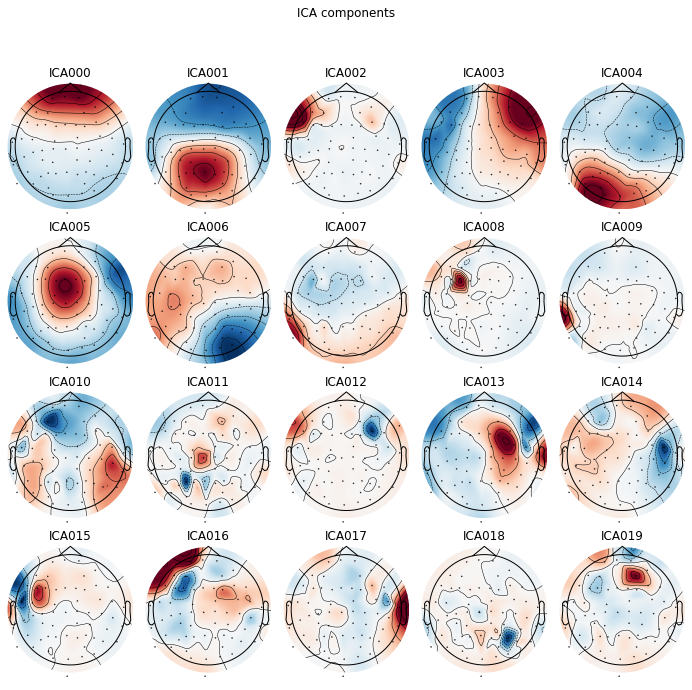

In [37]:
ica.plot_components(picks=range(0, 20));  # visualize our components

<br/>

Another way to visualize our ICA solution and one of the easiest ways to understand what patterns of variability in our data an ICA component captures, is to visualize the components in source space, i.e. how do the components represent latent sources of signal variability over time.
See <a href="https://mne.tools/stable/generated/mne.preprocessing.ICA.html#mne.preprocessing.ICA.plot_sources" title="MNE API: plot_sources()">MNE API: plot_sources() </a> for more info.

Creating RawArray with float64 data, n_channels=21, n_times=166800
    Range : 25800 ... 192599 =     42.956 ...   320.670 secs
Ready.
Opening ica-browser...


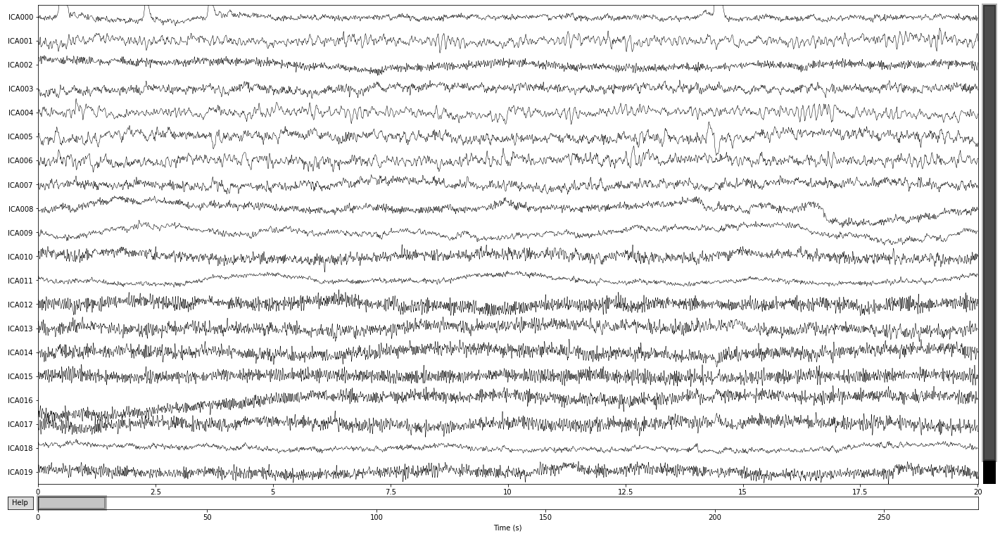

In [38]:
ica.plot_sources(raw_filtered);

<br/>
You can scroll through the plot_sources() output (if opened via binder or jupyter notebooks/lab) and compare it with the topographical map above, to see if you can spot some more artifcats or if you can identify genuine sources of neural activity.

Here we see that the first component (ICA 000) appears to capture our blink artifacts, while the later parts of ICA 003 appears to be indicative of horizontal eye movement. The topographical location of these artifacts in the plot above points towards the same intepretation. ICA 11 and ICA 18 additionaly appear to capture some weird artifacts, possibly due to channel noise or electrical interference.

To visualize what would happen to our signal if we were to extract these components, we can use the  <a href="https://mne.tools/stable/generated/mne.preprocessing.ICA.html#mne.preprocessing.ICA.plot_overlay" title="MNE API: plot_overlay()">plot_overlay() </a> function and pass the problematic ica components by their index as arguments.

Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 2 ICA components
    Projecting back using 59 PCA components


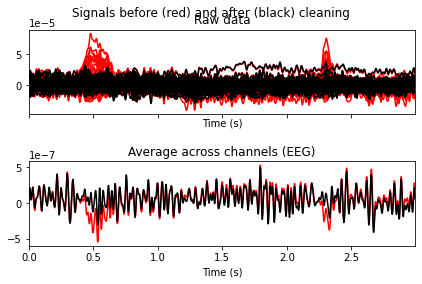

In [39]:
ica.plot_overlay(raw_filtered, exclude=[0, 3]);

<br/>

And it appears that the exclusion of the two components results in the elimination of the blink artifacts.

_Note of caution: It's generally advised not to exclude components if you're not certain that they may contain artifacts. Adjustments for artifcats that are only present in a small subset of all events (e.g. presented stimuli) can still be made later by excluding the affected epochs. So we'll stick with the exclusion of these 2 components for now._

<br/>

**3. Specify which components you want to remove from the data**

We'll add the components we want to exclude from our data to the ica.exlude object (which can be done the same way as we did above withe raw.info[bads] list), create a copy of our filtered data (as to not modify it in place) and apply the ica solution.

In [40]:
# apply ica to data
ica.exclude = [0, 3]

<br/>

**4. Reconstructing the Signal**

In [41]:
reconst_sig = raw_filtered.copy().pick_types(eeg=True, exclude='bads')
ica.apply(reconst_sig)

Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 2 ICA components
    Projecting back using 59 PCA components


<Raw | sample_audvis_raw.fif, 59 x 166800 (277.7 s), ~78.0 MB, data loaded>

<br/>

**And lastly comparing our ICA reconstructed signal to the filtered data, it seems that we got rid of most ocular artifacts.**

Opening raw-browser...


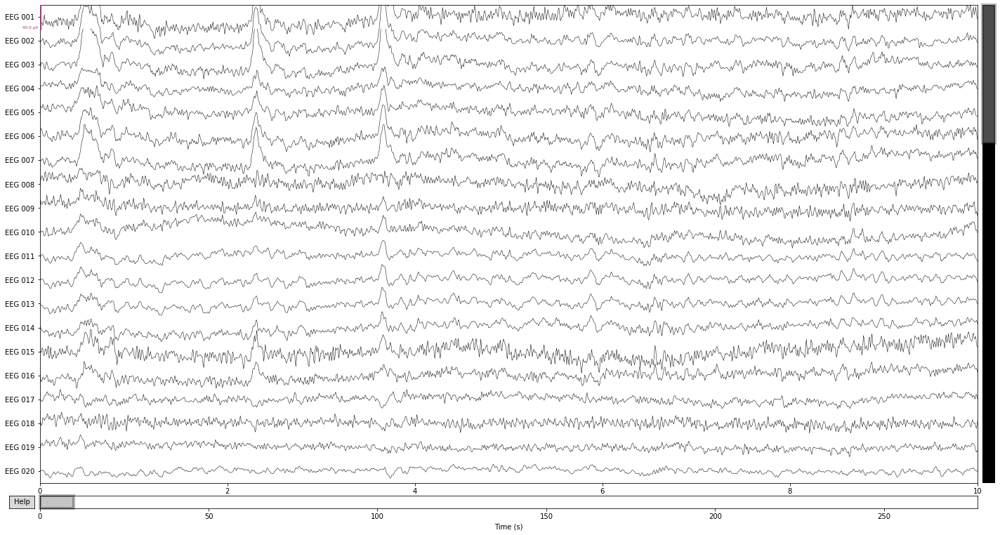

In [42]:
raw_filtered.plot();

Opening raw-browser...


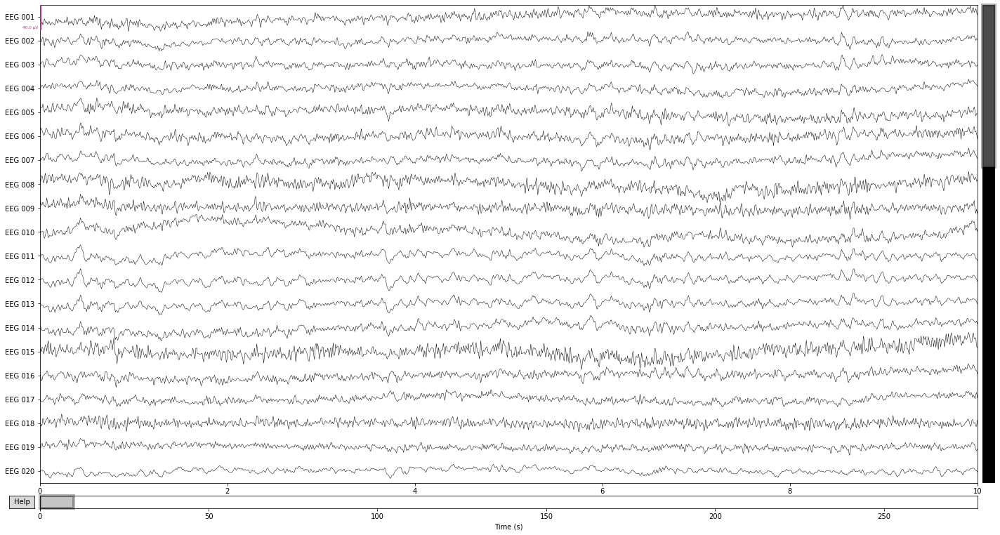

In [43]:
reconst_sig.plot();

<br/>

To free up space we get rid of the filtered data

In [44]:
del raw_filtered

<br/>

**Now we can save the preprocessed data for further processing.**

In [45]:
#reconst_sig.save('./reserach_module_data/bids_dataset/sub-test/ses-001/meg/sub-test_ses-001_sample_audiovis_eeg_data_preprocessed.fif',  # the filename
#         picks=['eeg', 'eog', 'stim'],  # the channels to pick (could also be single channels)
#         overwrite=True)  # checks if data is already present and overwrites if true

<br/>

**Other techniques for artifact detection/repair?**

For an overview of other techniques for preprocessing you can follow these MNE tutorials:

<a href="https://mne.tools/stable/auto_tutorials/preprocessing/50_artifact_correction_ssp.html" title="https://mne.tools/stable/auto_tutorials/preprocessing/50_artifact_correction_ssp.html">MNE tutorial: Repairing artifacts with Signal-space projection (SSP)</a>

<a href="https://mne.tools/stable/auto_tutorials/preprocessing/60_maxwell_filtering_sss.html" title="https://mne.tools/stable/auto_tutorials/preprocessing/60_maxwell_filtering_sss.html">MNE tutorial: Signal-space separation (SSS) and Maxwell filtering</a>

<a href="https://www.youtube.com/watch?v=6njzcZWuh9Q&list=PLn0OLiymPak2gDD-VDA90w9_iGDgOOb2o" title="https://www.youtube.com/watch?v=6njzcZWuh9Q&list=PLn0OLiymPak2gDD-VDA90w9_iGDgOOb2o">MNE tutorial: Surface Laplacian for cleaning, topoplogical localization, and connectivity</a>

<br/>
<br/>

## 4. Epoching

### Epochs

Epochs represent **chunks of continous eeg data time-locked to certain events or periods of activity** (e.g. experimental blocks). They are usually equal length and should contain enough time before an  event to allow for baseline correction and enough time after the stimulus to catch all possible activity (evoked/event-related potentials or changes in frequency band) of interest for later analysis.


The mne.Epochs objects can be treated the same as the previous raw objects in a number of ways, including the .info() manipulations we

**To create our epochs we  need two things:**
    - raw or preprocessed data
    - events
    
For more info on the Epochs data structure see the <a href="https://mne.tools/stable/auto_tutorials/epochs/10_epochs_overview.html#sphx-glr-auto-tutorials-epochs-10-epochs-overview-py" title="MNE tutorial: The Epochs data structure: discontinuous data)">MNE tutorial: The Epochs data structure: discontinuous data</a>

### Events

Events in the context of this tutorial are **flags indicating that at a certain time the presentation of a stimulus or a participant's reaction has occured**. Event IDs indicate what kind of condition was recorded, usually they are stored as simple integers. 

Information on what kind of stimulus/reaction was recorded is in general stored in the "Stim" channels or the metadata of the raw object (check raw.info['events']). Otherwise, if the Data is organized in the BIDS format, you can check the "_events.tsv" file in the subject folder and for the possible descriptions of the contained event-identifiers the "dataset_description.json" or the "README.txt". Some systems save events in a separate annotation file (e.g. eeglab set files), for which mne provides a dedicated function to convert these files to an event array. See <a href="https://mne.tools/stable/auto_tutorials/intro/20_events_from_raw.html" title="https://mne.tools/stable/auto_tutorials/intro/20_events_from_raw.html">MNE tutorial: Parsing events from raw data</a> for more info.

In [46]:
reconst_sig.info['events']  # check if info on events is contained in raw object

[{'channels': array([307, 308, 309, 310, 311, 312, 313, 314, 315], dtype=int32),
  'list': array([ 16422,      0,     64, ..., 168680,     32,      0], dtype=int32)}]

In [47]:
raw.info['ch_names']  # see if stim_channel are found in the raw object

['STI 001',
 'STI 002',
 'STI 003',
 'STI 004',
 'STI 005',
 'STI 006',
 'STI 014',
 'STI 015',
 'STI 016',
 'EEG 001',
 'EEG 002',
 'EEG 003',
 'EEG 004',
 'EEG 005',
 'EEG 006',
 'EEG 007',
 'EEG 008',
 'EEG 009',
 'EEG 010',
 'EEG 011',
 'EEG 012',
 'EEG 013',
 'EEG 014',
 'EEG 015',
 'EEG 016',
 'EEG 017',
 'EEG 018',
 'EEG 019',
 'EEG 020',
 'EEG 021',
 'EEG 022',
 'EEG 023',
 'EEG 024',
 'EEG 025',
 'EEG 026',
 'EEG 027',
 'EEG 028',
 'EEG 029',
 'EEG 030',
 'EEG 031',
 'EEG 032',
 'EEG 033',
 'EEG 034',
 'EEG 035',
 'EEG 036',
 'EEG 037',
 'EEG 038',
 'EEG 039',
 'EEG 040',
 'EEG 041',
 'EEG 042',
 'EEG 043',
 'EEG 044',
 'EEG 045',
 'EEG 046',
 'EEG 047',
 'EEG 048',
 'EEG 049',
 'EEG 050',
 'EEG 051',
 'EEG 052',
 'EEG 054',
 'EEG 055',
 'EEG 056',
 'EEG 057',
 'EEG 058',
 'EEG 059',
 'EEG 060',
 'EOG 061']

<br/>

### 4.1 finding/renaming events

To find the events in the raw file we can usually use <a href="https://mne.tools/stable/generated/mne.find_events.html">find_events()</a> function on our raw object. This function automatically checks if there are Stim channel present in the data. Stimulus channel do not collect EEG data, but the triggers associated with events that an experiment may contain.

In [48]:
events = mne.find_events(raw)

320 events found
Event IDs: [ 1  2  3  4  5 32]


<br/>

We ca visualize these stimulus channel using the <a href="https://mne.tools/stable/generated/mne.pick_types.html" title="https://mne.tools/stable/generated/mne.pick_types.html">.pick_types()</a> function on our raw when we sett the "stim" parameter to true.

Opening raw-browser...


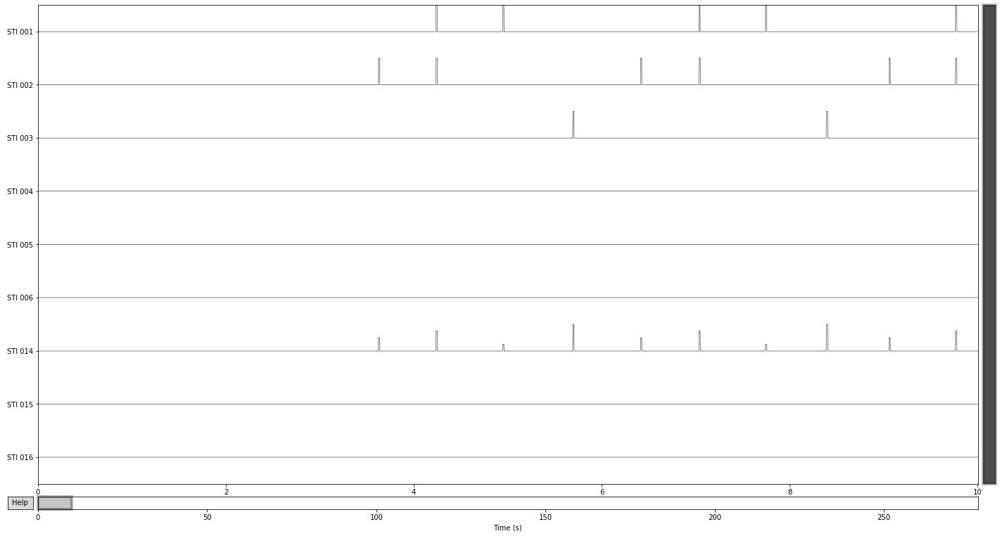

In [49]:
raw.copy().pick_types(meg=False, stim=True).plot();  # copy as to not modify our data in place

<br/>

Looking at these channels it becomes obvious that "STI 014" contains all relevant events contained in the other stimuli channel and encodes them by variations in amplitude. Therefore explicitly picking the events from this channel leads to the same result as the function above.

Looking at the other stim channels reveals that they each contain only a single kind of event. E.g. "STI 002" contains only the event with the ID "5"

In [50]:
events = mne.find_events(raw, stim_channel='STI 002')

146 events found
Event IDs: [5]


<br/>

Let's get all events

In [51]:
events = mne.find_events(raw, stim_channel='STI 014')

320 events found
Event IDs: [ 1  2  3  4  5 32]


<br/>

In the <a href="https://mne.tools/stable/auto_tutorials/epochs/10_epochs_overview.html" title="https://mne.tools/stable/auto_tutorials/epochs/10_epochs_overview.html">MNE: Epochs tutorial</a>, a list of labels for the events in the sample data corresponding to our event_id's is provided, which we can use to make our data a little more readable.

In [52]:
event_id = {'Auditory/Left': 1, 'Auditory/Right': 2,
            'Visual/Left': 3, 'Visual/Right': 4,
            'smiley': 5, 'button': 32}

<br/>

We can further use these descriptions when visulaizing our events using the <a href="https://mne.tools/stable/generated/mne.viz.plot_events.html" title="https://mne.tools/stable/generated/mne.viz.plot_events.html">plot_events()</a>
function

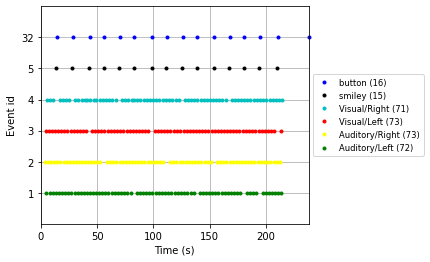

In [53]:
#Specify colors for events for the plot legend
color = {1: 'green', 2: 'yellow', 3: 'red', 4: 'c', 5: 'black', 32: 'blue'}

# Plot the events to get an idea of the paradigm
mne.viz.plot_events(events, 
                    raw.info['sfreq'],  # sampling frequency
                    raw.first_samp,  # starting point of plot (first sample)
                    color=color,  # the color dict specified above
                    event_id=event_id,  # our event dictionary
                    equal_spacing=True);

<br/>

**With this information we can finally create our epochs object using the <a href="https://mne.tools/stable/generated/mne.Epochs.html" title="MNE API: mne.Epochs()">mne.Epochs()</a> constructor function**


Baseline correction will be automatically applied given the intervall between tmin (epoch start) and t = 0 (i.e. the relevant event) of specified epochs, but can be specified by adding the baseline parameter to the mne.Epochs() constructor. Baseline correction  is applied to each channel and epoch respetively by calculating the mean for the baseline period and substracting this mean from the signal of the entire epoch.


In [54]:
# like with raw objects data is not automatically loaded into memory, therefore we set preload=True
epochs = mne.Epochs(reconst_sig, 
                    events, 
                    picks=['eeg'], 
                    tmin=-0.3,  # start of epoch relative to event in seconds
                    tmax=0.7, # end of epoch relative to event
                    #baseline=(-0.3,0),
                    preload=True)


Not setting metadata
320 matching events found
Setting baseline interval to [-0.2996928197375818, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 320 events and 601 original time points ...
0 bad epochs dropped


In [55]:
epochs.info

<Info | 20 non-empty values
 acq_pars: ACQch001 110113 ACQch002 110112 ACQch003 110111 ACQch004 110122 ...
 bads: []
 ch_names: EEG 001, EEG 002, EEG 003, EEG 004, EEG 005, EEG 006, EEG 007, ...
 chs: 59 EEG
 custom_ref_applied: True
 description: acquisition (megacq) VectorView system at NMR-MGH
 dev_head_t: MEG device -> head transform
 dig: 146 items (3 Cardinal, 4 HPI, 61 EEG, 78 Extra)
 events: 1 item (list)
 experimenter: MEG
 file_id: 4 items (dict)
 highpass: 0.1 Hz
 hpi_meas: 1 item (list)
 hpi_results: 1 item (list)
 lowpass: 40.0 Hz
 meas_date: 2002-12-03 19:01:10 UTC
 meas_id: 4 items (dict)
 nchan: 59
 proj_id: 1 item (ndarray)
 proj_name: test
 projs: []
 sfreq: 600.6 Hz
>

In [56]:
print(epochs)

<Epochs |  320 events (all good), -0.299693 - 0.699283 sec, baseline -0.299693 – 0 sec, ~89.5 MB, data loaded,
 '1': 72
 '2': 73
 '3': 73
 '4': 71
 '5': 15
 '32': 16>


<br/>
Let's recreate our dictionary containing the explicit event names and add our event dict to the event object, so that we can later access data based on these labels 

In [57]:
event_dict = {'auditory/left': 1, 'auditory/right': 2, 'visual/left': 3,
              'visual/right': 4, 'face': 5, 'buttonpress': 32}

epochs.event_id = event_dict
print(epochs)
print(epochs.event_id) 

<Epochs |  320 events (all good), -0.299693 - 0.699283 sec, baseline -0.299693 – 0 sec, ~89.5 MB, data loaded,
 'auditory/left': 72
 'auditory/right': 73
 'visual/left': 73
 'visual/right': 71
 'face': 15
 'buttonpress': 16>
{'auditory/left': 1, 'auditory/right': 2, 'visual/left': 3, 'visual/right': 4, 'face': 5, 'buttonpress': 32}


<br/>

**We can visualize epochs in the same way we visualized raw data previously**

Opening epochs-browser...


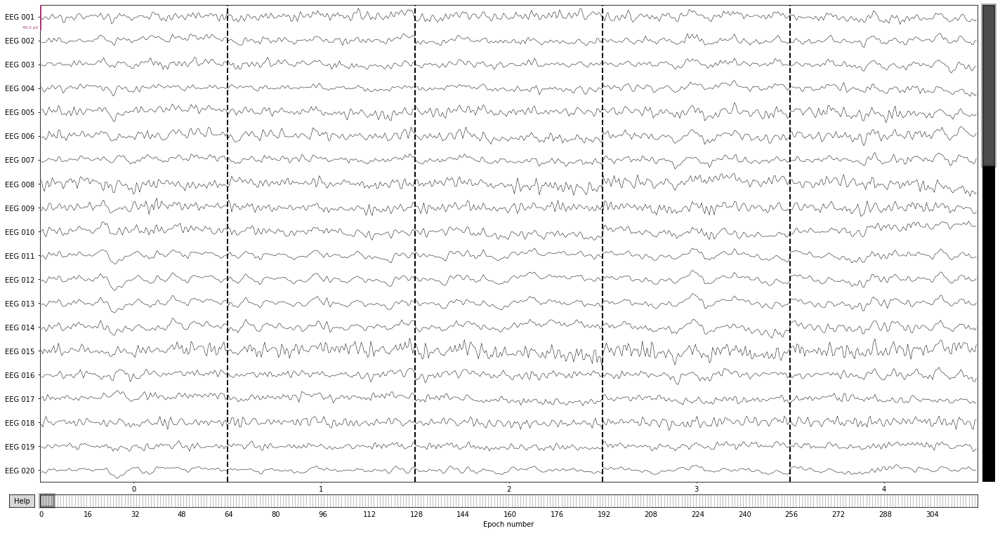

In [58]:
epochs.plot(n_epochs=5);  # pick first 5 epochs

You seem to have overlapping epochs. Some event lines may be duplicated in the plot.
Opening epochs-browser...


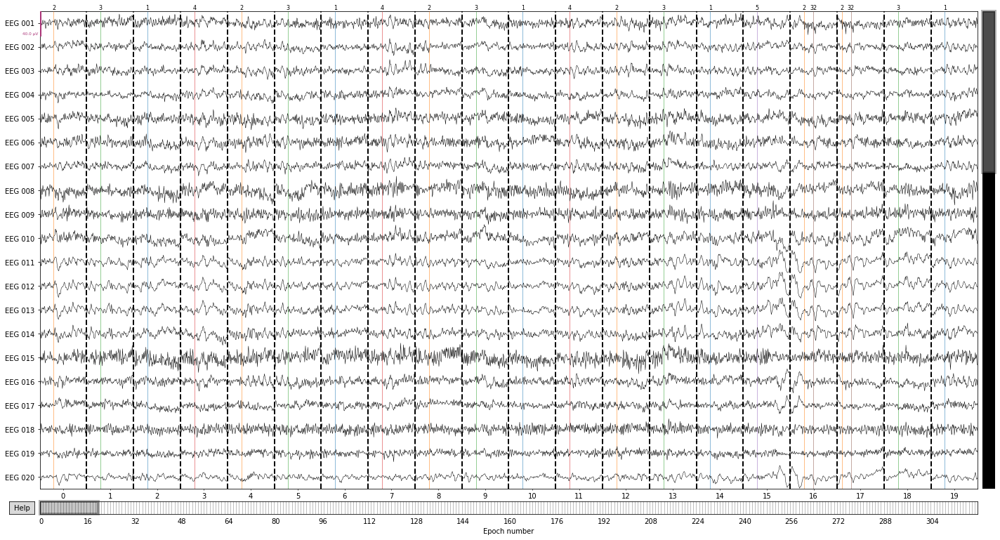

In [59]:
epochs.plot(events=events);  #or plot all by event type

<br/>

**We can then select epochs based on the events they are centered around in a number of ways.**

In [60]:
epochs.event_id # recall what our events are

{'auditory/left': 1,
 'auditory/right': 2,
 'visual/left': 3,
 'visual/right': 4,
 'face': 5,
 'buttonpress': 32}

<br/>
Select by a specific group of events (MNE treats the "/" character as a string separator, so we can explicitly call only auditory epochs etc.)

In [61]:
epochs['auditory']  # epochs centered around presentation of auditory stimulus

Number of events,145
Events,auditory/left: 72auditory/right: 73
Time range,-0.300 – 0.699 sec
Baseline,-0.300 – 0.000 sec


In [62]:
epochs['visual']  # epochs centered around presentation of visual stimulus


Number of events,144
Events,visual/left: 73visual/right: 71
Time range,-0.300 – 0.699 sec
Baseline,-0.300 – 0.000 sec


In [63]:
epochs['right']  # subselect only stimuli presented on the right side

Number of events,144
Events,auditory/right: 73visual/right: 71
Time range,-0.300 – 0.699 sec
Baseline,-0.300 – 0.000 sec


<br/>
select by multiple tags (i.e select all epochs containing either "right" or "auditory")

In [64]:
epochs[['right', 'auditory']]

Number of events,216
Events,auditory/left: 72auditory/right: 73visual/right: 71
Time range,-0.300 – 0.699 sec
Baseline,-0.300 – 0.000 sec


<br/>
or by using the explicit label of the specific event

In [65]:
# using explicit label 
epochs[['auditory/right']]

Number of events,73
Events,auditory/right: 73
Time range,-0.300 – 0.699 sec
Baseline,-0.300 – 0.000 sec


In [66]:
# using explicit label 
epochs[['auditory/left']]

Number of events,72
Events,auditory/left: 72
Time range,-0.300 – 0.699 sec
Baseline,-0.300 – 0.000 sec


<br/>

**We can further select epochs by their index using list comprehensions.**

<Epochs |  10 events (all good), -0.299693 - 0.699283 sec, baseline -0.299693 – 0 sec, ~5.7 MB, data loaded,
 'auditory/left': 2
 'auditory/right': 3
 'visual/left': 3
 'visual/right': 2>
<Epochs |  5 events (all good), -0.299693 - 0.699283 sec, baseline -0.299693 – 0 sec, ~4.3 MB, data loaded,
 'auditory/left': 2
 'auditory/right': 3>
<Epochs |  5 events (all good), -0.299693 - 0.699283 sec, baseline -0.299693 – 0 sec, ~4.3 MB, data loaded,
 'auditory/right': 5>
<Epochs |  5 events (all good), -0.299693 - 0.699283 sec, baseline -0.299693 – 0 sec, ~4.3 MB, data loaded,
 'auditory/right': 5>
Opening epochs-browser...


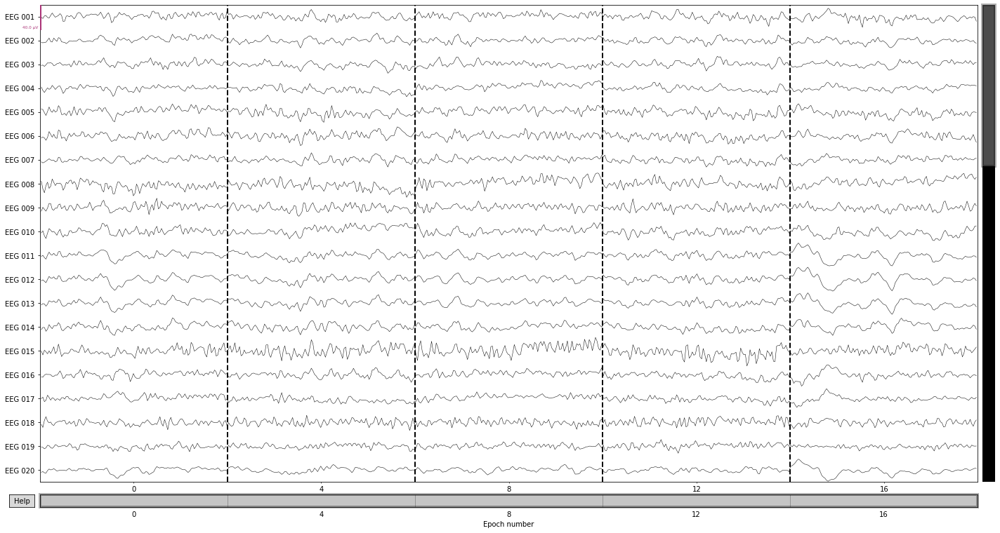

In [67]:
print(epochs[:10])    # first 10 epochs
print(epochs[:10:2])  # epochs 1, 3, 5, 7, 9; i.e [start:stop:step-size]
print(epochs['auditory'][:10:2])  # or select explicitly
print(epochs['auditory'][[0, 2, 4, 6, 8]])  # or select explicitly

epochs['auditory'][[0, 2, 4, 6, 8]].plot();

<br/>

and access the contained data again via the get_data() function, which returns a np.array of the shape (number of epochs, number of channels, number of time-points)

In [68]:
print(epochs.get_data())  # array (n_epochs, n_channels, n_times)
epochs.get_data().shape

[[[-1.53682615e-07  1.76059818e-07  4.55425791e-08 ...  4.66550977e-06
    6.94681262e-06  8.74132001e-06]
  [-4.28382745e-06 -3.49376566e-06 -2.85756692e-06 ...  5.60403187e-06
    5.43679679e-06  5.40910467e-06]
  [-4.85437478e-06 -4.64429674e-06 -4.16165507e-06 ...  2.27513486e-06
    1.89663829e-06  1.79428859e-06]
  ...
  [ 3.35085006e-06  3.47503013e-06  3.59880996e-06 ... -2.00678158e-08
    1.43032391e-07  1.75713615e-07]
  [ 1.31399230e-06  1.59594277e-06  1.87315172e-06 ...  1.97230798e-06
    2.16159788e-06  2.08545430e-06]
  [ 7.25402012e-07  1.04189705e-06  1.34003488e-06 ...  2.82710672e-06
    3.41396440e-06  3.85433967e-06]]

 [[ 4.64551860e-06  3.90649334e-06  3.28822790e-06 ...  5.63972371e-07
   -5.21831787e-07 -9.94766115e-07]
  [ 7.45167295e-07  3.55688679e-07  1.15773946e-07 ...  7.99763618e-06
    7.19334948e-06  6.26835613e-06]
  [ 3.48602309e-07  1.87500662e-06  3.19319823e-06 ...  3.31106000e-06
    2.70358563e-06  1.94277926e-06]
  ...
  [ 5.17067054e-06  4.0

(320, 59, 601)

<br/>

return data for all channels and all time-points for the first 2 epochs

In [69]:
epochs.get_data()[:1]  # first 2 epochs

array([[[-1.53682615e-07,  1.76059818e-07,  4.55425791e-08, ...,
          4.66550977e-06,  6.94681262e-06,  8.74132001e-06],
        [-4.28382745e-06, -3.49376566e-06, -2.85756692e-06, ...,
          5.60403187e-06,  5.43679679e-06,  5.40910467e-06],
        [-4.85437478e-06, -4.64429674e-06, -4.16165507e-06, ...,
          2.27513486e-06,  1.89663829e-06,  1.79428859e-06],
        ...,
        [ 3.35085006e-06,  3.47503013e-06,  3.59880996e-06, ...,
         -2.00678158e-08,  1.43032391e-07,  1.75713615e-07],
        [ 1.31399230e-06,  1.59594277e-06,  1.87315172e-06, ...,
          1.97230798e-06,  2.16159788e-06,  2.08545430e-06],
        [ 7.25402012e-07,  1.04189705e-06,  1.34003488e-06, ...,
          2.82710672e-06,  3.41396440e-06,  3.85433967e-06]]])

In [70]:
# get data only from last channel of first epoch
epochs.get_data()[0][58] # array of shape (n_epochs, n_channels, n_times)

array([ 7.25402012e-07,  1.04189705e-06,  1.34003488e-06,  1.59969878e-06,
        1.79864303e-06,  1.91752791e-06,  1.94524463e-06,  1.88383816e-06,
        1.75102161e-06,  1.57914142e-06,  1.41131460e-06,  1.29542790e-06,
        1.27588378e-06,  1.38466490e-06,  1.63345919e-06,  2.00927004e-06,
        2.47429604e-06,  2.96952822e-06,  3.42224362e-06,  3.75663999e-06,
        3.90628001e-06,  3.82543721e-06,  3.49761876e-06,  2.94083845e-06,
        2.20736239e-06,  1.37707635e-06,  5.46778039e-07, -1.83185063e-07,
       -7.24199222e-07, -1.01321881e-06, -1.02270717e-06, -7.65294039e-07,
       -2.92293203e-07,  3.13229067e-07,  9.48214875e-07,  1.50464269e-06,
        1.88538563e-06,  2.01879662e-06,  1.86948560e-06,  1.44312972e-06,
        7.85190425e-07, -2.60623527e-08, -8.91179942e-07, -1.70444344e-06,
       -2.36941662e-06, -2.81278663e-06, -2.99450320e-06, -2.91234651e-06,
       -2.60123216e-06, -2.12691103e-06, -1.57550316e-06, -1.04030856e-06,
       -6.08283410e-07, -

<br/>

So to get get the signal amplitude for the last time_point only from the last channel of the first epoch, we would do the following

In [71]:
epochs.get_data()[0][58][600] # array of shape (n_epochs, n_channels, n_times)

3.85433967048037e-06

<br/>

**At this point it honestly get's quite confusing, so it might be preferable to switch to a pandas DataFrame, although this may cost computation time later on if you're going to iterate over data for group level analysis etc.**

In [72]:
df = epochs.to_data_frame() # create dataframe with nested index
df

,time,condition,epoch,EEG 001,EEG 002,EEG 003,EEG 004,EEG 005,EEG 006,EEG 007,...,EEG 050,EEG 051,EEG 052,EEG 054,EEG 055,EEG 056,EEG 057,EEG 058,EEG 059,EEG 060
0,-300,auditory/right,0,-0.153683,-4.283827,-4.854375,-0.359896,0.394279,-4.400797,-1.202811,...,1.431784,2.940984,1.983121,3.429693,3.401887,2.569775,2.850704,3.350850,1.313992,0.725402
1,-298,auditory/right,0,0.176060,-3.493766,-4.644297,0.552180,1.194767,-4.472432,-1.341450,...,1.512172,3.084569,2.321209,3.474450,3.641959,2.769474,2.967791,3.475030,1.595943,1.041897
2,-296,auditory/right,0,0.045543,-2.857567,-4.161655,1.254199,2.031740,-4.396951,-1.585917,...,1.583144,3.254512,2.717577,3.489031,3.913700,3.017219,3.061254,3.598810,1.873152,1.340035
3,-295,auditory/right,0,-0.487266,-2.430577,-3.500332,1.659076,2.812987,-4.197414,-1.938551,...,1.629139,3.434417,3.133356,3.460027,4.174354,3.271970,3.116720,3.708310,2.110935,1.599699
4,-293,auditory/right,0,-1.306986,-2.231490,-2.770353,1.707647,3.458586,-3.905500,-2.383247,...,1.637843,3.602114,3.523734,3.372418,4.380678,3.488600,3.119026,3.786206,2.278554,1.798643
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
192315,693,buttonpress,319,2.177424,1.226092,1.980371,4.027102,3.636770,5.895603,-2.627936,...,0.908393,0.714505,-0.155360,-4.270140,-2.087490,-0.133901,-5.459906,-5.161124,-0.079998,-2.859459
192316,694,buttonpress,319,3.568347,2.174715,3.814056,5.023037,4.723616,7.064501,-0.862772,...,0.302466,0.040847,-1.079467,-5.185661,-2.753452,-0.917123,-6.363676,-5.877935,-0.965209,-3.658738
192317,696,buttonpress,319,4.801556,2.755080,5.487070,6.010036,5.894544,8.044493,1.102437,...,-0.300690,-0.659023,-2.043852,-5.954887,-3.406557,-1.700440,-7.101583,-6.459842,-1.770694,-4.319212
192318,698,buttonpress,319,5.811528,2.827093,6.751744,6.947730,7.003489,8.759697,3.042707,...,-0.827598,-1.294786,-2.913984,-6.503422,-3.974303,-2.391284,-7.588334,-6.835500,-2.418470,-4.728637


In [73]:
df['EEG 001']

0        -0.153683
1         0.176060
2         0.045543
3        -0.487266
4        -1.306986
            ...   
192315    2.177424
192316    3.568347
192317    4.801556
192318    5.811528
192319    6.560628
Name: EEG 001, Length: 192320, dtype: float64

<br/>
access DataFrame for the first 3 epochs

In [74]:
df.loc[df['epoch'] == 2]  

,time,condition,epoch,EEG 001,EEG 002,EEG 003,EEG 004,EEG 005,EEG 006,EEG 007,...,EEG 050,EEG 051,EEG 052,EEG 054,EEG 055,EEG 056,EEG 057,EEG 058,EEG 059,EEG 060
1202,-300,auditory/left,2,1.674279,-5.832824,-1.065193,1.883506,5.954980,2.699902,-2.285878,...,-0.104895,-1.505234,-0.529909,1.899286,-3.035422,-2.038059,1.035239,-1.483787,-3.769601,-3.125808
1203,-298,auditory/left,2,-1.139467,-6.130494,-0.920979,1.742139,6.821386,1.957775,-1.995849,...,-0.224304,-1.505949,-0.838635,2.545271,-2.980840,-2.069036,1.434824,-1.321935,-3.780897,-3.264083
1204,-296,auditory/left,2,-3.626785,-5.904082,-0.980405,1.820046,7.347637,1.134160,-1.841423,...,-0.337660,-1.557832,-1.188400,3.153409,-3.003274,-2.200103,1.786290,-1.187298,-3.843002,-3.445020
1205,-295,auditory/left,2,-5.608351,-5.208556,-1.205763,2.047516,7.496192,0.325561,-1.847855,...,-0.395011,-1.616724,-1.508391,3.711745,-3.050096,-2.358457,2.106030,-1.042580,-3.901562,-3.629170
1206,-293,auditory/left,2,-6.982464,-4.166364,-1.525351,2.319378,7.273102,-0.392720,-2.024001,...,-0.351401,-1.628021,-1.722664,4.218457,-3.057204,-2.458569,2.419665,-0.845292,-3.896153,-3.770549
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1798,693,auditory/left,2,2.043974,-1.729950,2.528953,-2.284008,0.338302,-12.519796,-8.186935,...,7.011435,2.393073,1.964756,6.236749,7.292279,6.802502,7.313462,6.041348,11.048047,9.728544
1799,694,auditory/left,2,1.041975,-1.069995,3.209934,-2.245922,1.779407,-12.104938,-8.419878,...,6.809046,2.163413,1.783681,5.497183,6.954686,6.565084,6.652048,5.317792,10.685427,9.278551
1800,696,auditory/left,2,0.485706,-0.466572,3.563600,-2.100884,3.173691,-11.122786,-8.233974,...,6.593292,2.003936,1.744278,4.588079,6.616948,6.399289,5.856608,4.538647,10.327299,8.851482
1801,698,auditory/left,2,0.455080,-0.061777,3.516555,-1.933487,4.267798,-9.708467,-7.613939,...,6.450861,1.997810,1.904081,3.625994,6.383641,6.379514,5.046047,3.833549,10.068029,8.563565


<br/>
access epochs containing certain conditions

In [75]:
df.loc[df['condition'] == 'auditory/right']  # access epochs containing certain condition

,time,condition,epoch,EEG 001,EEG 002,EEG 003,EEG 004,EEG 005,EEG 006,EEG 007,...,EEG 050,EEG 051,EEG 052,EEG 054,EEG 055,EEG 056,EEG 057,EEG 058,EEG 059,EEG 060
0,-300,auditory/right,0,-0.153683,-4.283827,-4.854375,-0.359896,0.394279,-4.400797,-1.202811,...,1.431784,2.940984,1.983121,3.429693,3.401887,2.569775,2.850704,3.350850,1.313992,0.725402
1,-298,auditory/right,0,0.176060,-3.493766,-4.644297,0.552180,1.194767,-4.472432,-1.341450,...,1.512172,3.084569,2.321209,3.474450,3.641959,2.769474,2.967791,3.475030,1.595943,1.041897
2,-296,auditory/right,0,0.045543,-2.857567,-4.161655,1.254199,2.031740,-4.396951,-1.585917,...,1.583144,3.254512,2.717577,3.489031,3.913700,3.017219,3.061254,3.598810,1.873152,1.340035
3,-295,auditory/right,0,-0.487266,-2.430577,-3.500332,1.659076,2.812987,-4.197414,-1.938551,...,1.629139,3.434417,3.133356,3.460027,4.174354,3.271970,3.116720,3.708310,2.110935,1.599699
4,-293,auditory/right,0,-1.306986,-2.231490,-2.770353,1.707647,3.458586,-3.905500,-2.383247,...,1.637843,3.602114,3.523734,3.372418,4.380678,3.488600,3.119026,3.786206,2.278554,1.798643
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
189911,693,auditory/right,315,-5.079067,-1.246712,1.783957,-8.151322,-3.918948,-7.072288,-5.418097,...,1.261009,0.157957,-3.381464,-0.743014,0.518337,-1.923513,-2.839258,-6.641621,-2.358054,-4.796171
189912,694,auditory/right,315,-3.837659,-2.927242,1.225115,-9.141204,-4.650545,-7.129471,-5.996793,...,1.455271,0.235975,-3.178535,-0.681336,0.589503,-1.697325,-2.546469,-6.249273,-2.154781,-3.983449
189913,696,auditory/right,315,-2.791697,-4.747554,0.463874,-9.929189,-4.818245,-6.417768,-6.079887,...,1.703780,0.372526,-2.914523,-0.548596,0.705804,-1.404995,-2.165034,-5.768835,-1.912190,-3.176036
189914,698,auditory/right,315,-2.036109,-6.489735,-0.503002,-10.361328,-4.388295,-4.839074,-5.676215,...,1.956369,0.533225,-2.617024,-0.355357,0.826090,-1.086330,-1.738569,-5.249411,-1.660041,-2.441243


<br/>
looking at the first epoch for auditory stimuli presented on the right

In [76]:
df.loc[(df['condition'] == 'auditory/right') & (df['epoch'] == 0)]

,time,condition,epoch,EEG 001,EEG 002,EEG 003,EEG 004,EEG 005,EEG 006,EEG 007,...,EEG 050,EEG 051,EEG 052,EEG 054,EEG 055,EEG 056,EEG 057,EEG 058,EEG 059,EEG 060
0,-300,auditory/right,0,-0.153683,-4.283827,-4.854375,-0.359896,0.394279,-4.400797,-1.202811,...,1.431784,2.940984,1.983121,3.429693,3.401887,2.569775,2.850704,3.350850,1.313992,0.725402
1,-298,auditory/right,0,0.176060,-3.493766,-4.644297,0.552180,1.194767,-4.472432,-1.341450,...,1.512172,3.084569,2.321209,3.474450,3.641959,2.769474,2.967791,3.475030,1.595943,1.041897
2,-296,auditory/right,0,0.045543,-2.857567,-4.161655,1.254199,2.031740,-4.396951,-1.585917,...,1.583144,3.254512,2.717577,3.489031,3.913700,3.017219,3.061254,3.598810,1.873152,1.340035
3,-295,auditory/right,0,-0.487266,-2.430577,-3.500332,1.659076,2.812987,-4.197414,-1.938551,...,1.629139,3.434417,3.133356,3.460027,4.174354,3.271970,3.116720,3.708310,2.110935,1.599699
4,-293,auditory/right,0,-1.306986,-2.231490,-2.770353,1.707647,3.458586,-3.905500,-2.383247,...,1.637843,3.602114,3.523734,3.372418,4.380678,3.488600,3.119026,3.786206,2.278554,1.798643
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
596,693,auditory/right,0,-0.455145,6.226211,3.524521,-1.760868,1.436730,-0.952867,-0.575605,...,-5.390209,7.107356,6.180171,-2.608987,6.799990,9.376177,-3.391412,-0.670084,0.983064,1.359057
597,694,auditory/right,0,2.112229,5.886371,2.854166,-1.546046,0.293328,-0.279262,-1.076823,...,-5.279555,7.422220,6.893315,-2.349400,6.982848,10.153623,-3.134838,-0.302329,1.557232,2.124709
598,696,auditory/right,0,4.665510,5.604032,2.275135,-1.128092,-0.678382,0.720977,-1.028660,...,-5.317972,7.551767,7.389360,-2.155697,6.942251,10.714484,-2.914002,-0.020068,1.972308,2.827107
599,698,auditory/right,0,6.946813,5.436797,1.896638,-0.548043,-1.324796,1.912227,-0.405261,...,-5.549491,7.445577,7.609505,-2.030483,6.642568,10.979282,-2.739930,0.143032,2.161598,3.413964


<br/>
looking at the signal from a single electrode for the first epoch for auditory stimuli presented on the right (jeez)

In [77]:
# looking at a subset of the dataframe
df.loc[(df['condition'] == 'auditory/right') & (df['epoch'] == 0)]['EEG 001']

0     -0.153683
1      0.176060
2      0.045543
3     -0.487266
4     -1.306986
         ...   
596   -0.455145
597    2.112229
598    4.665510
599    6.946813
600    8.741320
Name: EEG 001, Length: 601, dtype: float64

<br/>

### 4.2 rejecting bad epochs

As discussed earlier we'll get rid of epochs containing artifacts.

This way we'll only reject a small subset of relevant data, while the rejection of ICA components or whole channels might have lead to a greater loss of relevant data in the signal. This is one of the reasons why we collect so many trials in EEG experiments. 

As a point of caution, epoch rejection is best done after repairing our signal for eye-blinks, as otherwise we might lose a significant number of epochs. 
- for more information see the <a href="https://mne.tools/stable/auto_tutorials/preprocessing/20_rejecting_bad_data.html#tut-reject-epochs-section" title="MNE tutorial: Rejecting Epochs based on channel amplitude">MNE tutorial: Rejecting Epochs based on channel amplitude</a>

For now we'll simply **reject eppochs by maximum(minimum peak-to-peak signal value thresholds** (exceeding 100 µV, as it's highly unlikely that any eeg-signal may reach this amplitude or epochs with channel with signal below 1 µV to get rid of flat channels) using the <a href="https://mne.tools/stable/generated/mne.Epochs.html#mne.Epochs.drop_bad" title="https://mne.tools/stable/generated/mne.Epochs.html#mne.Epochs.drop_bad">epochs.drop_bad()</a> function.



In [78]:
# define upper and lower threshold as dict(channel_type:criteria)
reject_criteria_upper = dict(eeg=100e-6)  # 100 µV
reject_criteria_flat = dict(eeg=1e-6)  # 1 µV

In [79]:
epochs.drop_bad(reject=reject_criteria_upper, flat=reject_criteria_flat)

    Rejecting  epoch based on EEG : ['EEG 008', 'EEG 009']
    Rejecting  epoch based on EEG : ['EEG 008']
    Rejecting  epoch based on EEG : ['EEG 004', 'EEG 008']
    Rejecting  epoch based on EEG : ['EEG 008']
    Rejecting  epoch based on EEG : ['EEG 008']
    Rejecting  epoch based on EEG : ['EEG 008']
    Rejecting  epoch based on EEG : ['EEG 008']
7 bad epochs dropped


Number of events,313
Events,auditory/left: 70auditory/right: 72buttonpress: 16face: 14visual/left: 71visual/right: 70
Time range,-0.300 – 0.699 sec
Baseline,-0.300 – 0.000 sec


<br/>

We can then further visulaize how many epochs were dropped for each channel.

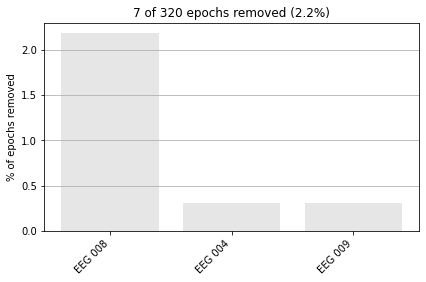

In [80]:
epochs.plot_drop_log();

<br/>
If no arguments are provided for the drop_bad() function, all epochs that were marked as bad would be dropped.

<br/>

**Another strategy for rejecting epochs is to declare the above criteria while creating the epochs object**

We can specify where in the epoch to look for artifacts with the **reject_tmin** and **reject_tmax** parameters of  <a href="https://mne.tools/stable/generated/mne.Epochs.html" title="MNE API: mne.Epochs()">mne.Epochs()</a>. Reject_tmin = 0 would mean that we look for artifacts after the event, while reject_tmax = 0 would mean that we only look for artifacts in the timeframe before the event occurde. If not specified they default to the ends of the timeframe specified for the epochs.

In [81]:
epochs = mne.Epochs(reconst_sig, 
                    events, 
                    picks=['eeg'], 
                    tmin=-0.3, tmax=0.7,
                    reject_tmin=-0.3,
                    reject_tmax=0, 
                    reject=reject_criteria_upper, 
                    flat=reject_criteria_flat, 
                    preload=True)

Not setting metadata
320 matching events found
Setting baseline interval to [-0.2996928197375818, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 320 events and 601 original time points ...
    Rejecting  epoch based on EEG : ['EEG 008']
1 bad epochs dropped


<br/>

For the automatic rejection of epochs we can use the **reject_by_annotation parameter**. 
This can be achieved by adding information about the timeframe of an artifact, break, experimental block etc. to an <a href="https://mne.tools/stable/generated/mne.Annotations.html#mne.Annotations" title="https://mne.tools/stable/generated/mne.Annotations.html#mne.Annotations">mne.Annotations</a>  object and using the <a href="https://mne.tools/stable/generated/mne.Epochs.html#mne.Epochs.set_annotations" title="https://mne.tools/stable/generated/mne.Epochs.html#mne.Epochs.set_annotations">.set_annotations()</a> function to add this to the .info object of our data.

So we'll define 3 hypothetical breaks in the next step by **specfifying their onset time, duration and adding a description**. If the description contains the string "bad" annotated data-spans will be automatically excluded from most analysis steps, including the creation of epochs.

In [82]:
onset_breaks = [reconst_sig.first_time + 30, reconst_sig.first_time + 90, reconst_sig.first_time + 150]
durations = [10, 10, 10]
description_breaks = ['bad_break_1', 'bad_break_2', 'bad_break_3']

<br/>

Now we create our Annotations object

In [83]:
breaks = mne.Annotations(onset=onset_breaks,
                               duration=durations,
                               description=description_breaks,
                               orig_time=raw.info['meas_date'])

<br/>

and set the annotations to our raw object.

In [84]:
reconst_sig.set_annotations(reconst_sig.annotations + breaks)

<Raw | sample_audvis_raw.fif, 59 x 166800 (277.7 s), ~78.0 MB, data loaded>

<br/>
Let's check how this look in our interactive plots

Opening raw-browser...


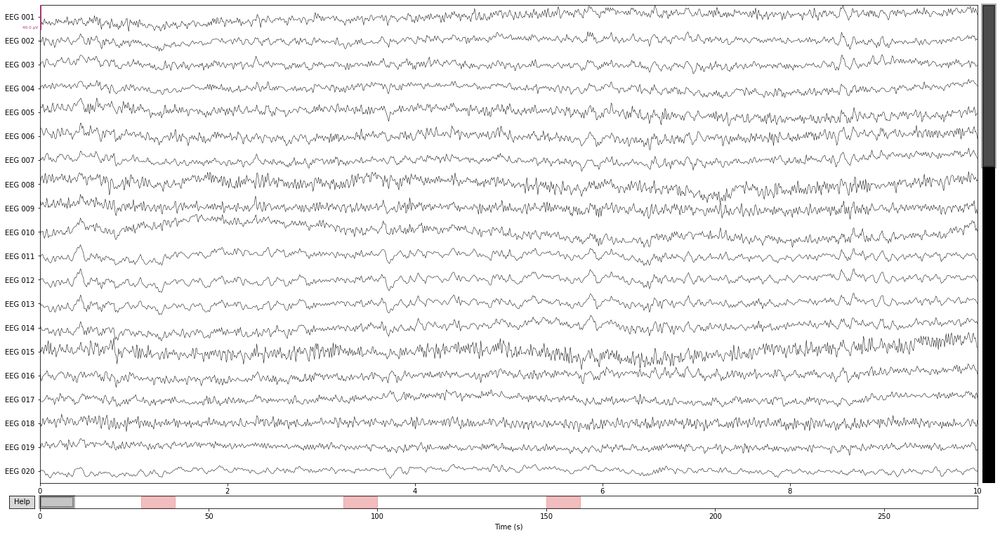

In [85]:
reconst_sig.plot();

<br/>

**Now when we create our epochs object, any epoch contained in the designated "breaks" will be excluded.**

In [86]:
epochs = mne.Epochs(reconst_sig, 
                    events, 
                    picks=['eeg'], 
                    tmin=-0.3, tmax=0.7,
                    #reject_tmin=-0.3,
                    #reject_tmax=0, 
                    reject=reject_criteria_upper, 
                    flat=reject_criteria_flat,
                    reject_by_annotation=True,
                    preload=True)

epochs.event_id = event_dict # rename our events

Not setting metadata
320 matching events found
Setting baseline interval to [-0.2996928197375818, 0.0] sec
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 320 events and 601 original time points ...
    Rejecting  epoch based on EEG : ['EEG 008', 'EEG 009']
    Rejecting  epoch based on EEG : ['EEG 008']
    Rejecting  epoch based on EEG : ['EEG 004', 'EEG 008']
    Rejecting  epoch based on EEG : ['EEG 008']
    Rejecting  epoch based on EEG : ['EEG 008']
    Rejecting  epoch based on EEG : ['EEG 008']
    Rejecting  epoch based on EEG : ['EEG 008']
56 bad epochs dropped


In [87]:
epochs.event_id

{'auditory/left': 1,
 'auditory/right': 2,
 'visual/left': 3,
 'visual/right': 4,
 'face': 5,
 'buttonpress': 32}

<br/>

and to visualize the dropped epochs.

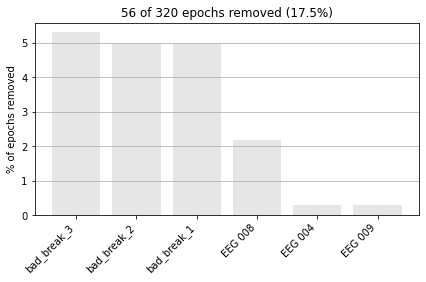

In [88]:
epochs.plot_drop_log();

<br/>

**Now we could convert this data into a dataframe for further maipulation or export our epochs as an tsv file in long format for statistical analysis.**

In [89]:
df = epochs.to_data_frame(index=['condition', 'epoch', 'time']) # create dataframe with nested index
df.sort_index(inplace=True)
df


channel                    EEG 001   EEG 002   EEG 003    EEG 004   EEG 005  \
condition     epoch time                                                      
auditory/left 2     -300  1.674279 -5.832824 -1.065193   1.883506  5.954980   
                    -298 -1.139467 -6.130494 -0.920979   1.742139  6.821386   
                    -296 -3.626785 -5.904082 -0.980405   1.820046  7.347637   
                    -295 -5.608351 -5.208556 -1.205763   2.047516  7.496192   
                    -293 -6.982464 -4.166364 -1.525351   2.319378  7.273102   
...                            ...       ...       ...        ...       ...   
visual/right  318    693  7.132074  2.962601  4.083015   6.192311  4.220870   
                     694  5.733377  3.510989  2.754277   7.373238  4.454477   
                     696  4.293615  4.293051  1.406555   8.565687  4.861299   
                     698  2.947380  5.202027  0.167555   9.551748  5.305607   
                     699  1.805879  6.084712 -0.808913  10.152494  5.633928   

channel                    EEG 006   EEG 007    EEG 008   EEG 009   EEG 010  \
condition     epoch time                                                      
auditory/left 2     -300  2.699902 -2.285878  -1.041173  1.371179  2.461690   
                    -298  1.957775 -1.995849   0.406024  0.980153  2.041891   
                    -296  1.134160 -1.841423   2.170672  0.731463  1.703899   
                    -295  0.325561 -1.847855   3.967159  0.648780  1.442463   
                    -293 -0.392720 -2.024001   5.483102  0.738784  1.243973   
...                            ...       ...        ...       ...       ...   
visual/right  318    693  2.193333 -2.139301   4.822322  7.136358  2.772771   
                     694  2.821823 -2.153671   8.907488  5.166448  2.031963   
                     696  3.564821 -1.755798  13.013912  3.079259  1.418302   
                     698  4.120528 -1.106711  16.533834  1.150853  0.947768   
                     699  4.214714 -0.385346  18.988465 -0.379245  0.601400   

channel                   ...   EEG 050   EEG 051   EEG 052   EEG 054  \
condition     epoch time  ...                                           
auditory/left 2     -300  ... -0.104895 -1.505234 -0.529909  1.899286   
                    -298  ... -0.224304 -1.505949 -0.838635  2.545271   
                    -296  ... -0.337660 -1.557832 -1.188400  3.153409   
                    -295  ... -0.395011 -1.616724 -1.508391  3.711745   
                    -293  ... -0.351401 -1.628021 -1.722664  4.218457   
...                       ...       ...       ...       ...       ...   
visual/right  318    693  ... -3.877052 -3.739459 -1.819167 -3.514831   
                     694  ... -3.833959 -3.616641 -1.841351 -3.399617   
                     696  ... -3.879939 -3.601303 -1.966689 -3.508406   
                     698  ... -3.953208 -3.625353 -2.126498 -3.826098   
                     699  ... -3.987063 -3.616629 -2.246846 -4.308630   

channel                    EEG 055   EEG 056   EEG 057   EEG 058   EEG 059  \
condition     epoch time                                                     
auditory/left 2     -300 -3.035422 -2.038059  1.035239 -1.483787 -3.769601   
                    -298 -2.980840 -2.069036  1.434824 -1.321935 -3.780897   
                    -296 -3.003274 -2.200103  1.786290 -1.187298 -3.843002   
                    -295 -3.050096 -2.358457  2.106030 -1.042580 -3.901562   
                    -293 -3.057204 -2.458569  2.419665 -0.845292 -3.896153   
...                            ...       ...       ...       ...       ...   
visual/right  318    693 -3.185711 -3.474153 -1.837076 -1.615154 -1.390848   
                     694 -3.245535 -3.390298 -1.811255 -1.702233 -1.236660   
                     696 -3.450976 -3.458747 -2.040714 -2.018640 -1.355870   
                     698 -3.719349 -3.617442 -2.494923 -2.510294 -1.685481   
                     699 -3.959156 -3.792737 -3.110733 -3.

In [90]:
df.to_csv('./reserach_module_data/bids_dataset/sub-test/ses-001/meg/sub-test_ses-001_sample_audiovis_eeg_data_epo.tsv', 
          sep='\t')


In [91]:
epochs.event_id

{'auditory/left': 1,
 'auditory/right': 2,
 'visual/left': 3,
 'visual/right': 4,
 'face': 5,
 'buttonpress': 32}

<br/>

**Or save the epochs as a .fif file using epochs<a href="https://mne.tools/stable/generated/mne.Epochs.html#mne.Epochs.save">.save()</a> which can be imported back into mne using the <a href="https://mne.tools/stable/generated/mne.read_epochs.html">.read_epochs()</a> function.**

In [92]:
epochs.save('./reserach_module_data/bids_dataset/sub-test/ses-001/meg/sub-test_ses-001_sample_audiovis_eeg_data_epo.fif',
            overwrite=True)

Overwriting existing file.
